In [1]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [2]:
import pandas
import numpy
import root_numpy
from utils import shrink_floats
import os

## Read the data

In [65]:
data_test = pandas.DataFrame(root_numpy.root2array('../data/global_test.root', 'tree', 
                                                   branches=['MCParticleType', 'TrackP', 
                                                             'TrackPt', 'NumProtoParticles']))
shrink_floats(data_test)

In [66]:
len(data_test)

5999990

In [67]:
data_test.head()

,MCParticleType,TrackP,TrackPt,NumProtoParticles
0,11,282192.875000,4498.217773,40
1,-11,2287.530029,110.991821,68
2,-11,5883.500000,465.838043,110
3,11,8357.629883,337.342407,40
4,-11,9521.540039,319.172119,81


#### add signal column (from 0 to 5 classes), weights (to balance data), charges (to check assymetry)

In [70]:
from utils import compute_labels_and_weights, compute_charges, names_labels_correspondence, labels_names_correspondence
from utils import roc_auc_score_one_vs_all_for_separate_algorithms

In [71]:
data_test['Signal'], data_test['Weight'] = compute_labels_and_weights(data_test.MCParticleType.values)
data_test['Charge'] =  compute_charges(data_test.MCParticleType.values)

In [30]:
from utils import plot_flatness_by_particle, plot_roc_one_vs_one, plot_roc_one_vs_rest
from utils import compute_roc_auc_matrix, compute_cvm_by_particle
from utils import plot_flatness_particle

def generate_plots(preds, labels, weights, data, path=''):
    matrix_auc_one_vs_rest = roc_auc_score_one_vs_all_for_separate_algorithms(labels, preds, weights)
    print matrix_auc_one_vs_rest
    
    plot_roc_one_vs_rest(labels, preds, weights)
    plt.savefig(os.path.join(path, 'overall_roc_auc.png'), format='png')
    
    f, matrix_auc_one_vs_one = compute_roc_auc_matrix(labels, preds, weights)
    f.savefig(os.path.join(path, 'class_vs_class_roc_auc_matrix.png'), format='png')
    
    matrix_auc_one_vs_rest.to_csv(os.path.join(path, 'class_vs_rest_roc_auc_matrix.csv'))
    matrix_auc_one_vs_one.to_csv(os.path.join(path, 'class_vs_class_roc_auc_matrix.csv'))
    
    plot_roc_one_vs_one(labels, preds, weights)
    plt.savefig(os.path.join(path, 'one_vs_one_roc_auc.png'), format='png')
    
    plot_flatness_by_particle(labels, preds, 1 / data.TrackP.values,
                              '1/(Momentum MeV/$c$)', thresholds=[5, 20, 40, 60, 80], weights=weights, 
                              ignored_sideband=0.02)
    plt.savefig(os.path.join(path, 'p_flatness.png'), format='png')

    plot_flatness_by_particle(labels, preds, 1 / data.TrackPt.values,
                              '1/(Transverse Momentum MeV/$c$)', thresholds=[5, 20, 40, 60, 80], weights=weights, 
                              ignored_sideband=0.02)
    plt.savefig(os.path.join(path, 'pt_flatness.png'), format='png')

    cvm_values = compute_cvm_by_particle(labels, preds, 
                                         {'TrackP': data.TrackP.values, 'TrackPt': data.TrackPt.values})
    
    print cvm_values
    cvm_values.to_csv(os.path.join(path, 'flatness.csv'))
    
    plot_flatness_particle(labels, preds, 1 / data.TrackPt.values,
                          '1/(Transverse Momentum MeV/$c$)', particle_name='Pion', thresholds=[80, 85, 90, 95],
                           weights=weights, 
                           ignored_sideband=0.02)
    plt.savefig(os.path.join(path, 'pt_pion_flatness.png'), format='png')
    
    plot_flatness_particle(labels, preds, 1 / data.TrackP.values,
                          '1/(Momentum MeV/$c$)', particle_name='Pion', thresholds=[80, 85, 90, 95],
                           weights=weights, 
                           ignored_sideband=0.02)
    plt.savefig(os.path.join(path, 'p_pion_flatness.png'), format='png')

# Baseline model

In [11]:
import cPickle
with open('models/baseline_probs.pkl', 'r') as f:
    preds_baseline = cPickle.load(f)

      Ghost  Electron      Muon      Pion      Kaon    Proton
0  0.948407  0.985487  0.984409  0.934599  0.914773  0.917803


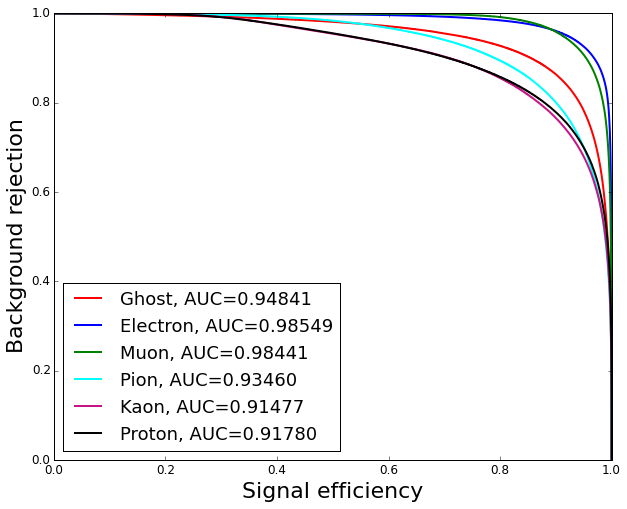

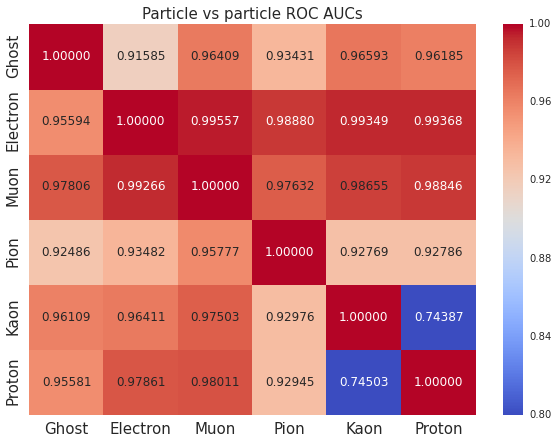

            TrackP   TrackPt
Ghost     0.003707  0.006480
Electron  0.007750  0.021756
Muon      0.026489  0.035962
Pion      0.020184  0.013491
Kaon      0.042760  0.032328
Proton    0.037028  0.043761


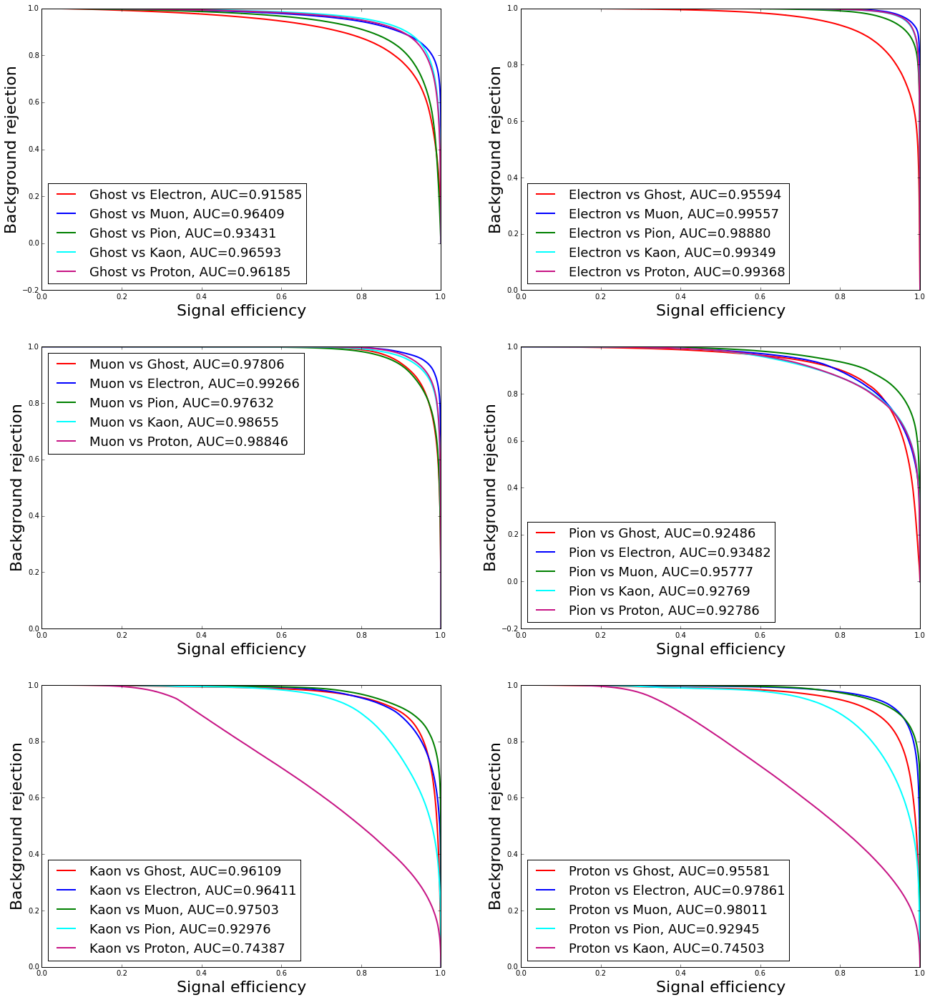

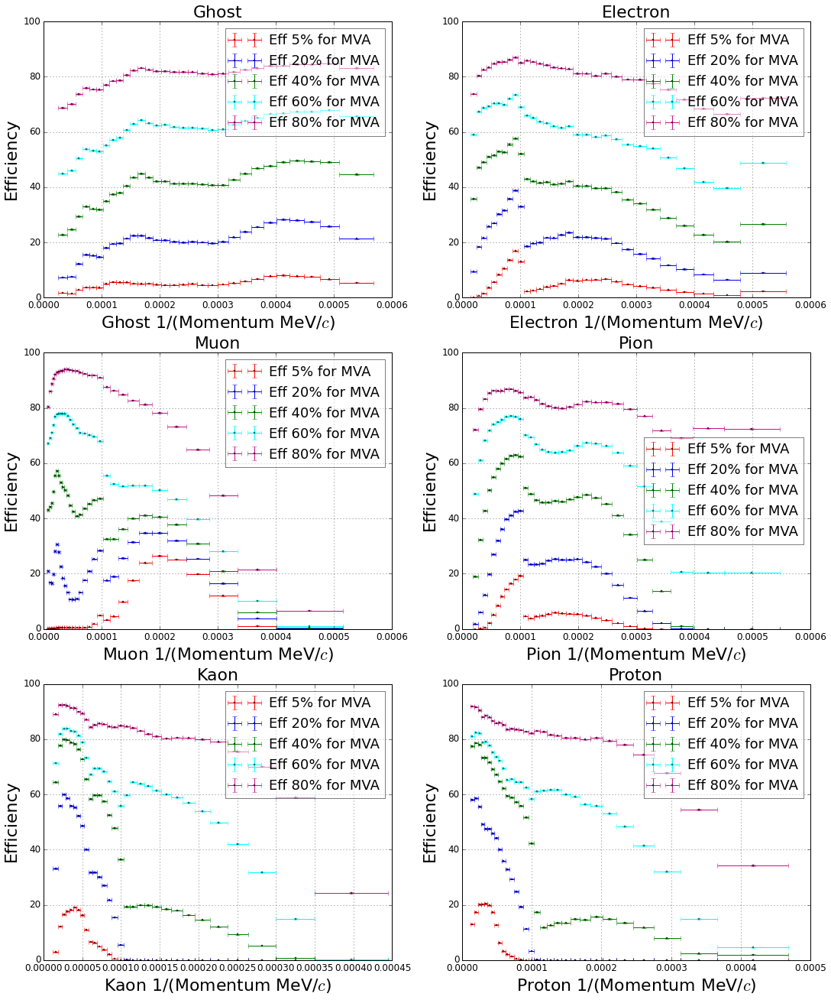

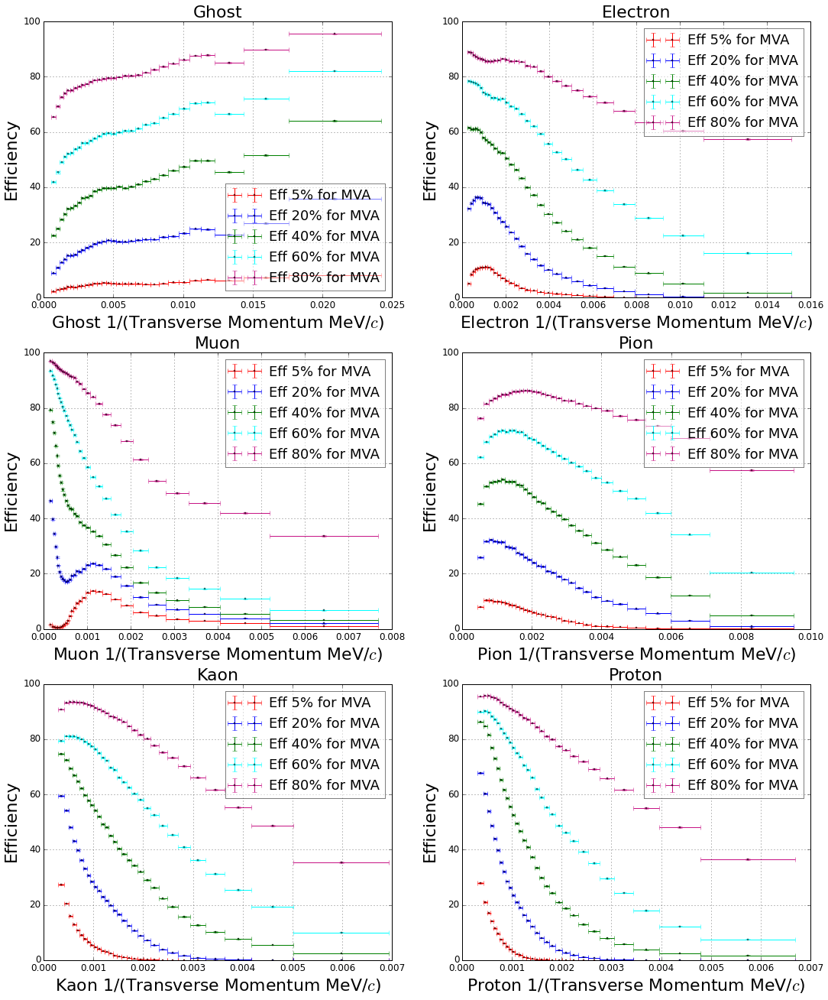

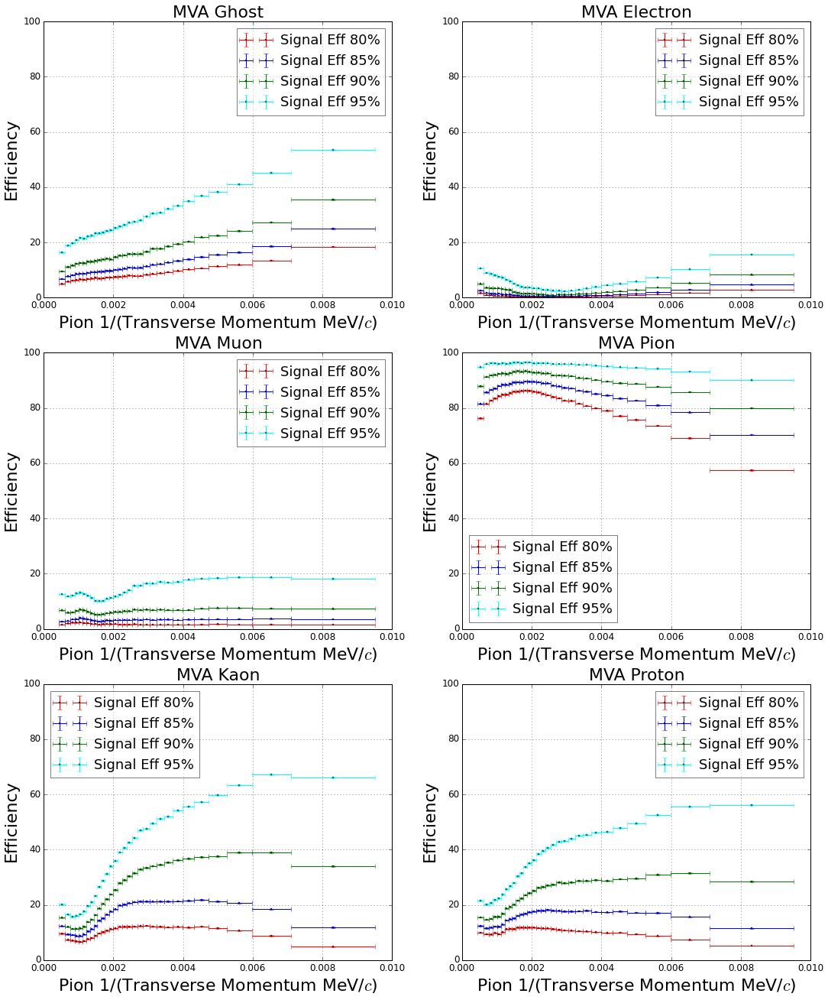

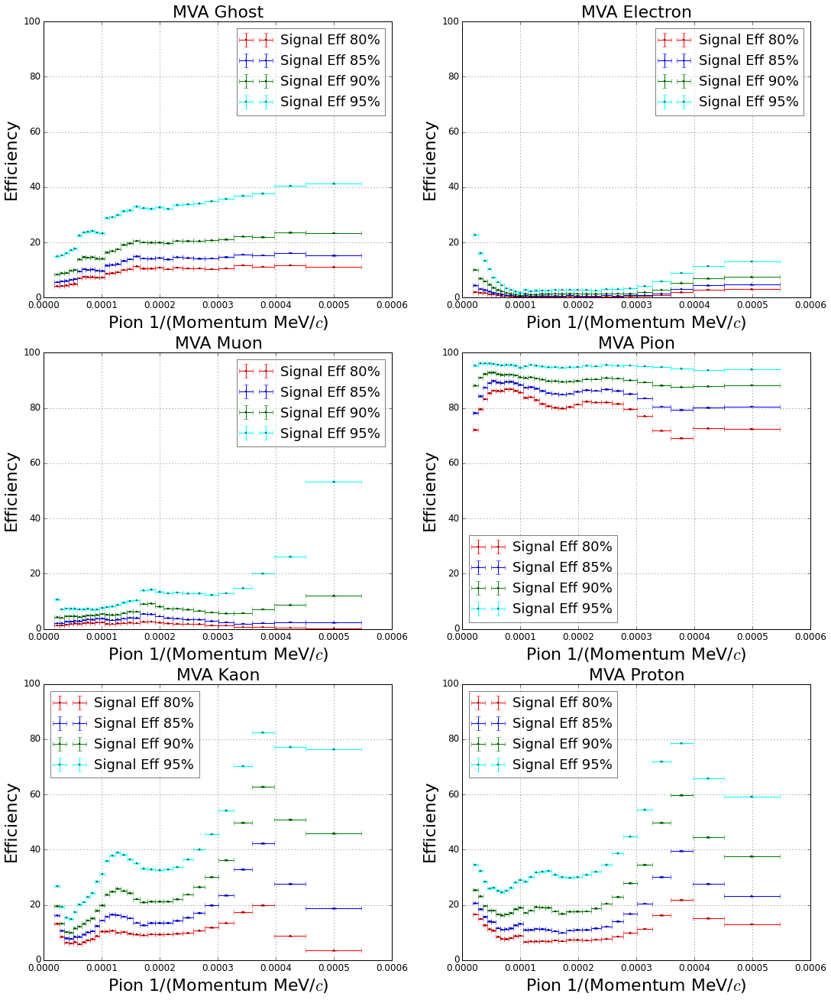

In [31]:
generate_plots(preds_baseline, data_test.Signal.values, data_test.Weight.values, data_test, path='img/baseline')

# XGBoost

In [137]:
with open('models/xgb_probs.pkl', 'r') as f:
    preds_xgb = cPickle.load(f)

# full DT 

In [87]:
import cPickle
with open('models/dt_probs.pkl', 'r') as f:
    preds_dt = cPickle.load(f)

     Ghost  Electron      Muon      Pion      Kaon    Proton
0  0.96366  0.991364  0.992683  0.957662  0.930922  0.931059


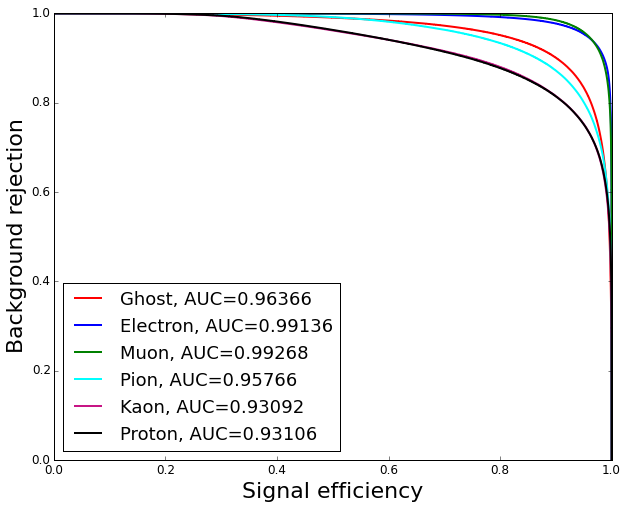

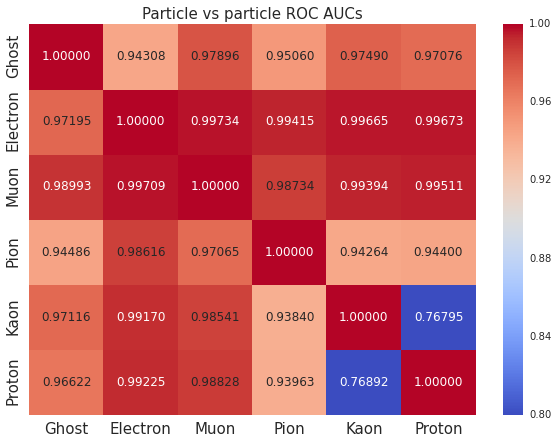

            TrackP   TrackPt
Ghost     0.003038  0.009252
Electron  0.012236  0.048241
Muon      0.040494  0.060058
Pion      0.019472  0.016038
Kaon      0.044647  0.028331
Proton    0.035281  0.043130


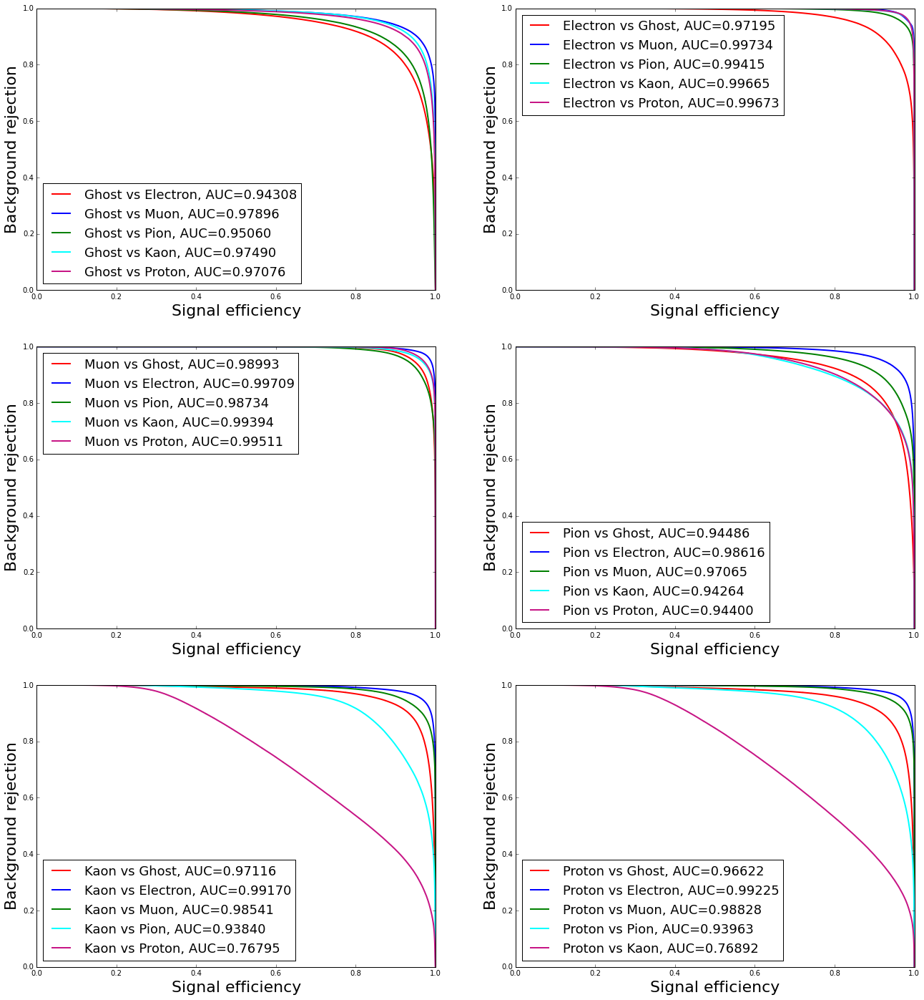

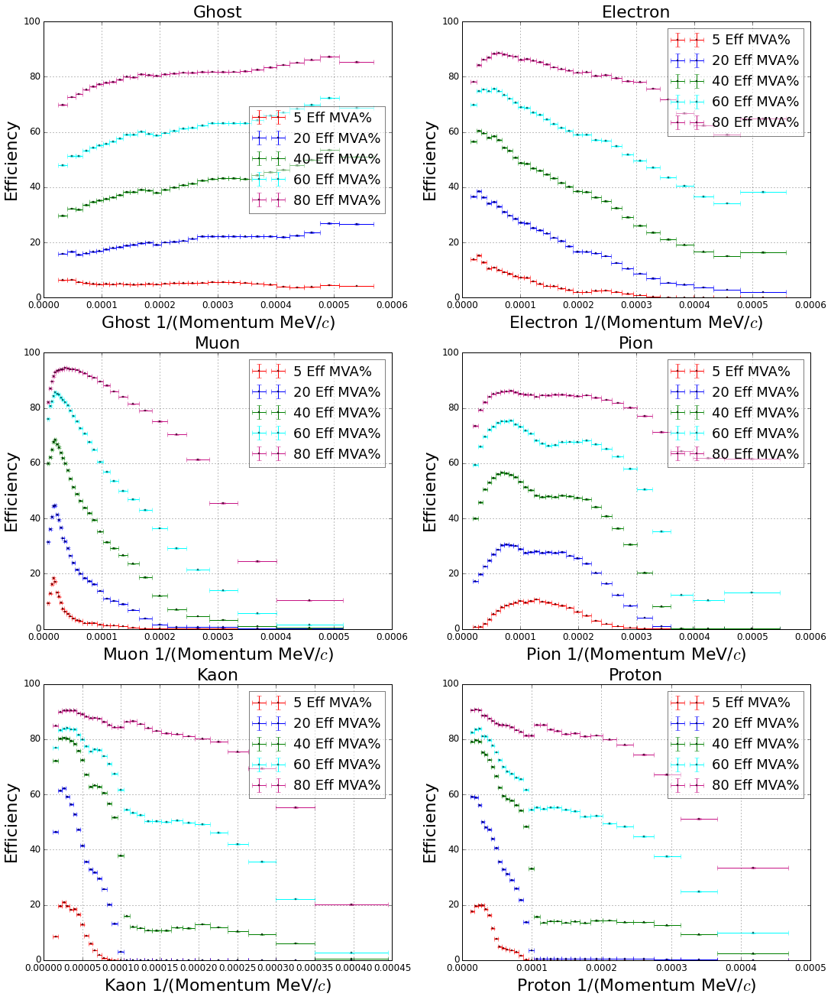

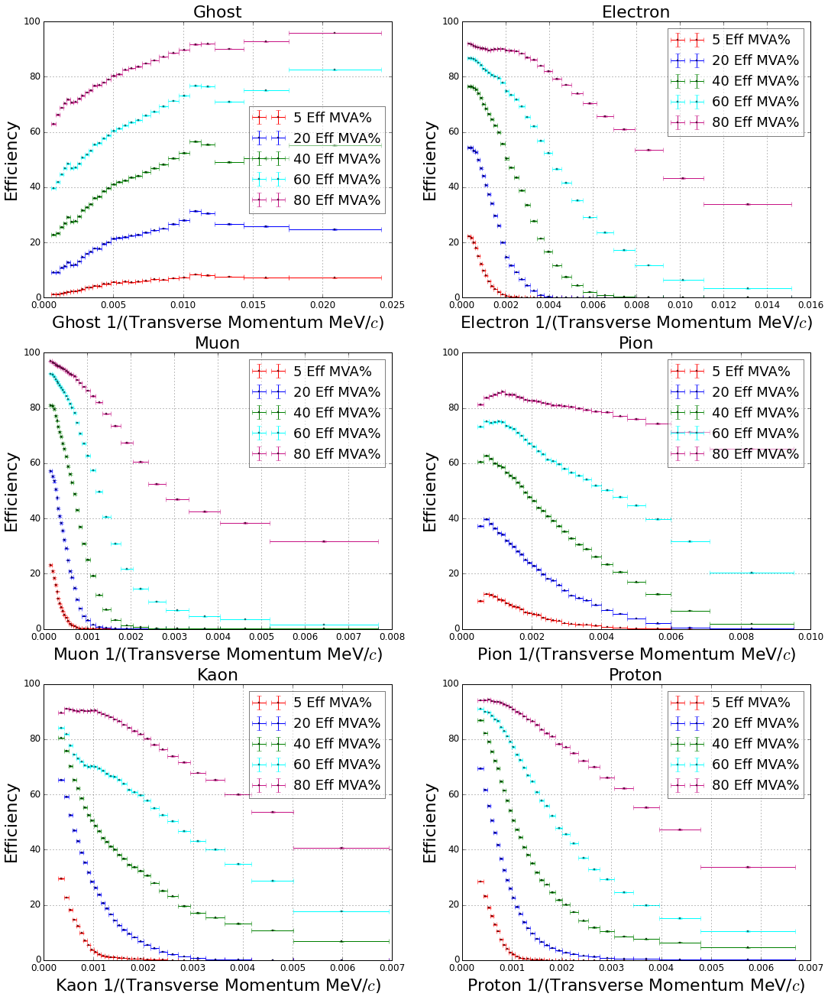

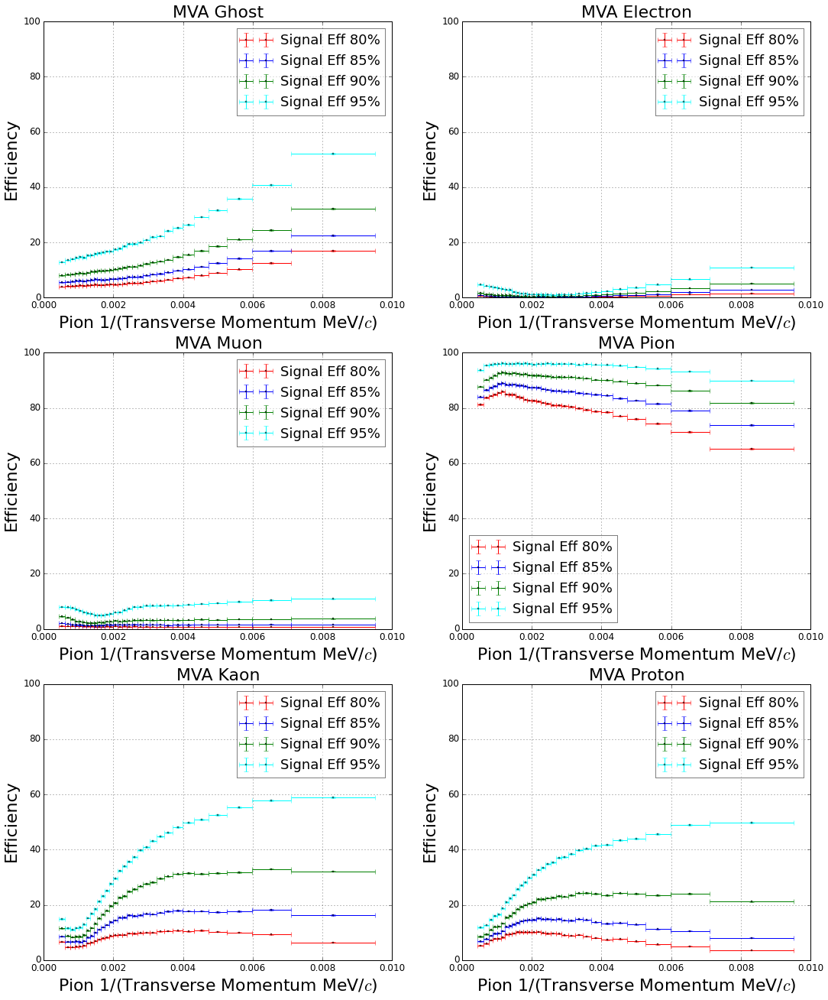

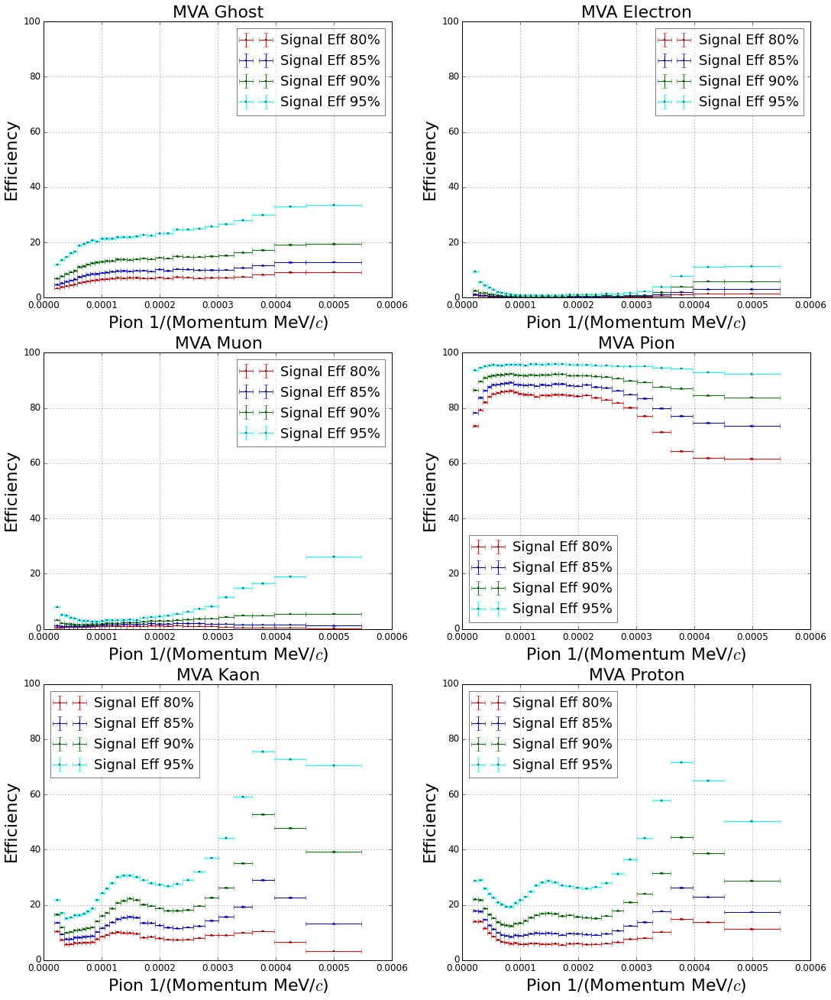

In [89]:
generate_plots(preds_dt, data_test.Signal.values, 
               data_test.Weight.values, data_test, path='img/dt')

# Keras single layer

In [37]:
import cPickle
with open('models/keras_onelayer_probs.pkl', 'r') as f:
    preds_keras_one_layer = cPickle.load(f)

     Ghost  Electron      Muon      Pion      Kaon    Proton
0  0.95832  0.989737  0.991355  0.954533  0.926137  0.925448


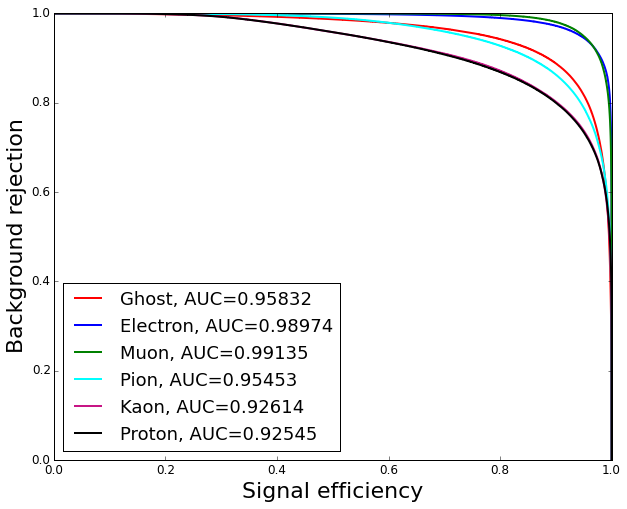

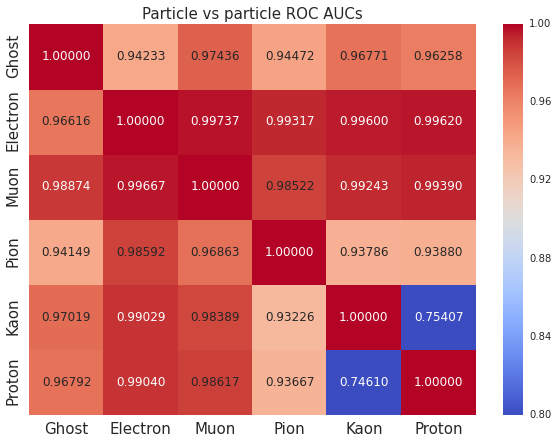

            TrackP   TrackPt
Ghost     0.004414  0.006229
Electron  0.010007  0.038742
Muon      0.042531  0.055692
Pion      0.020063  0.017304
Kaon      0.046209  0.024786
Proton    0.038575  0.047849


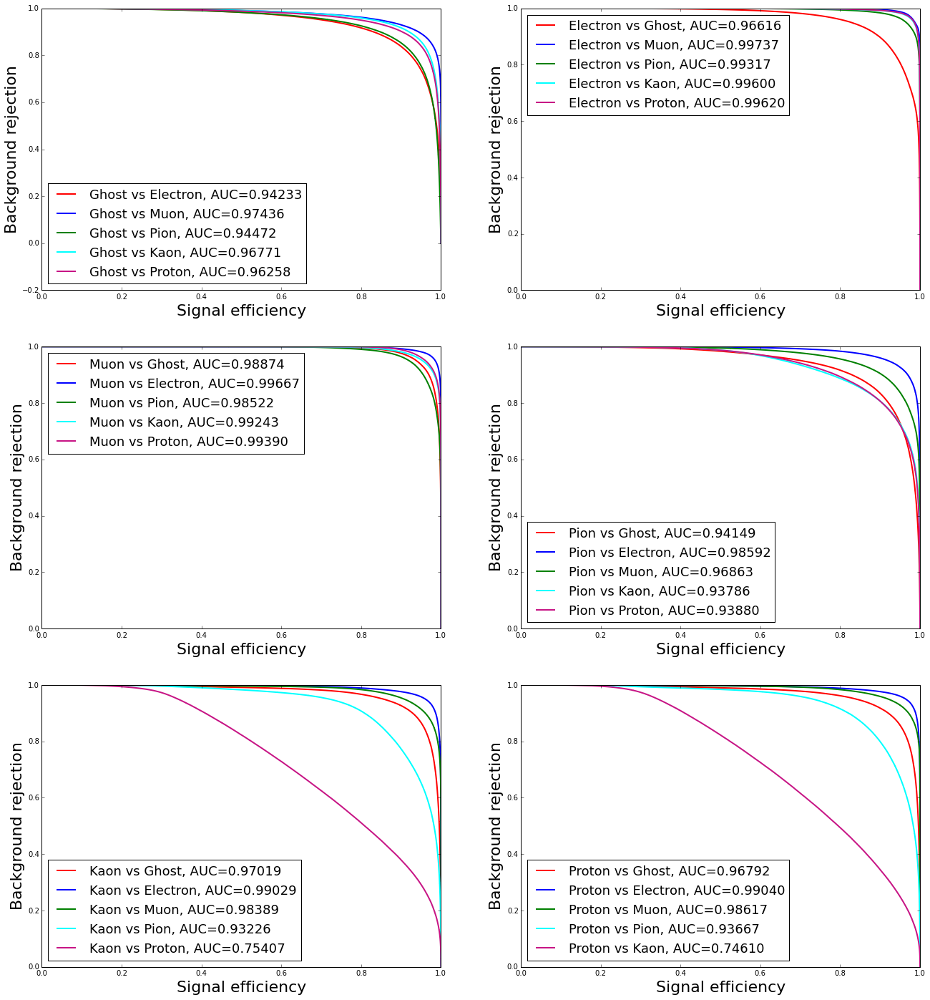

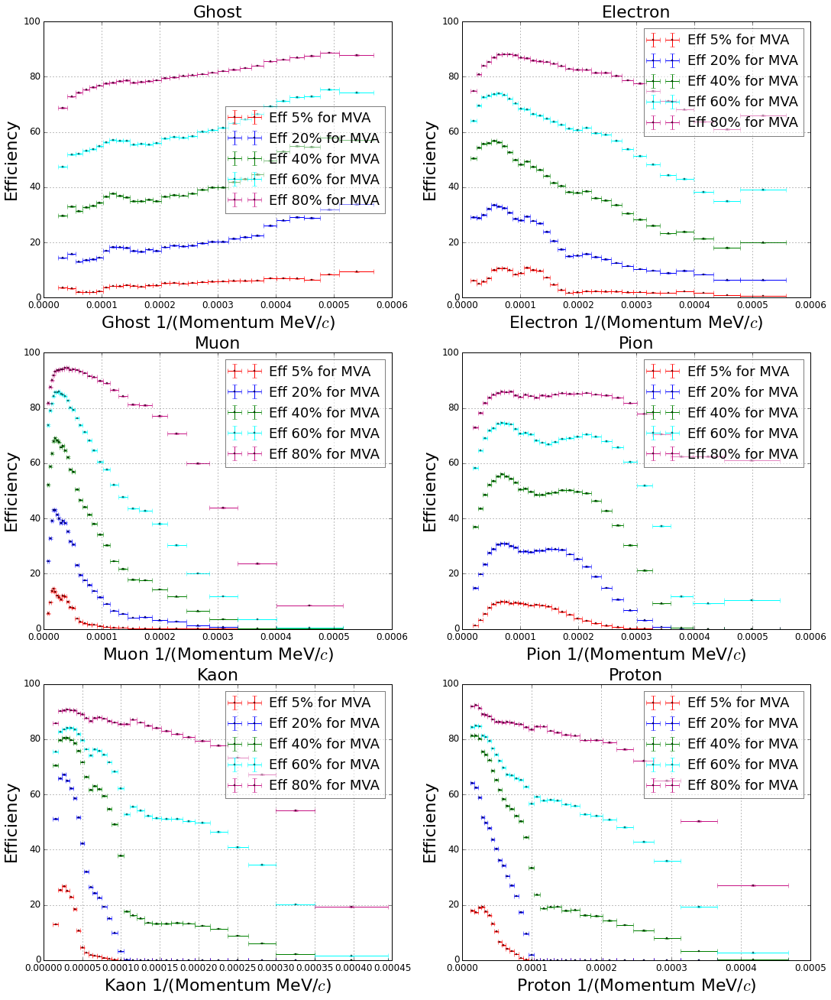

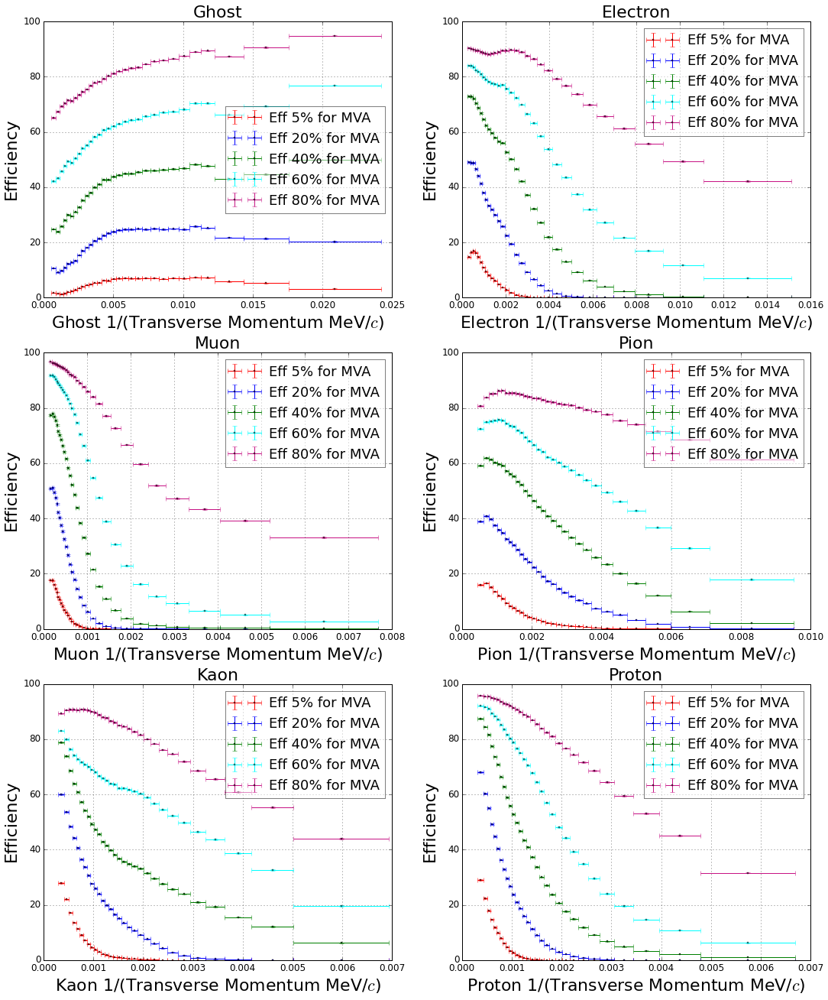

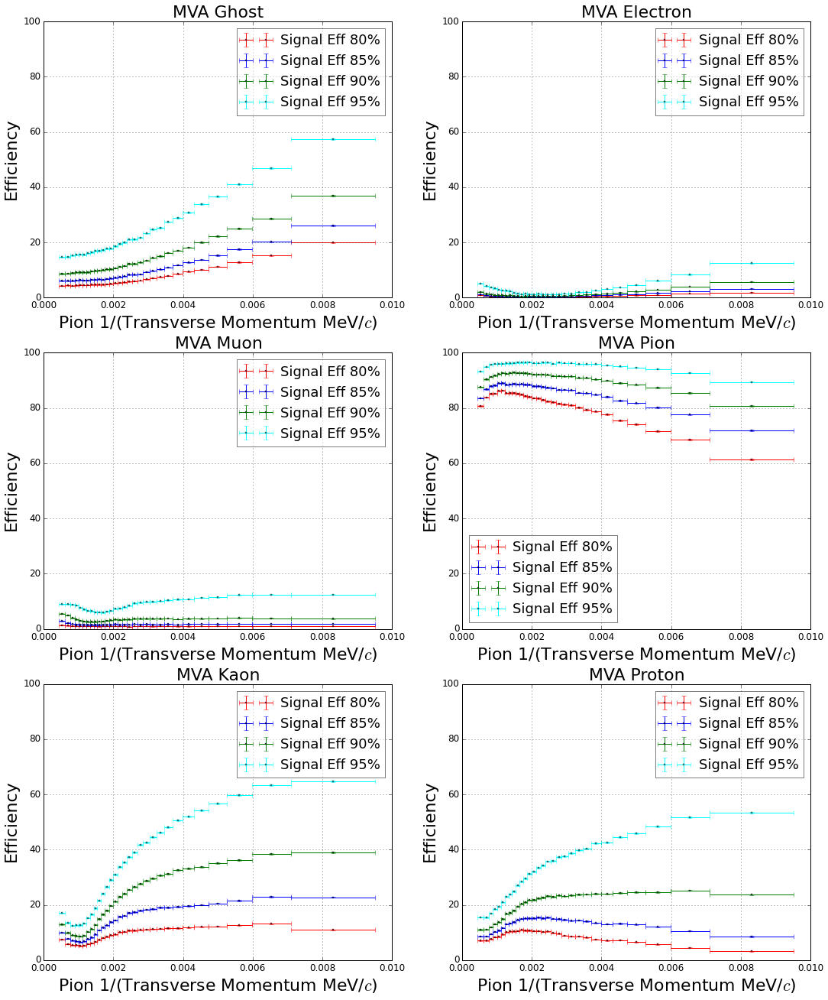

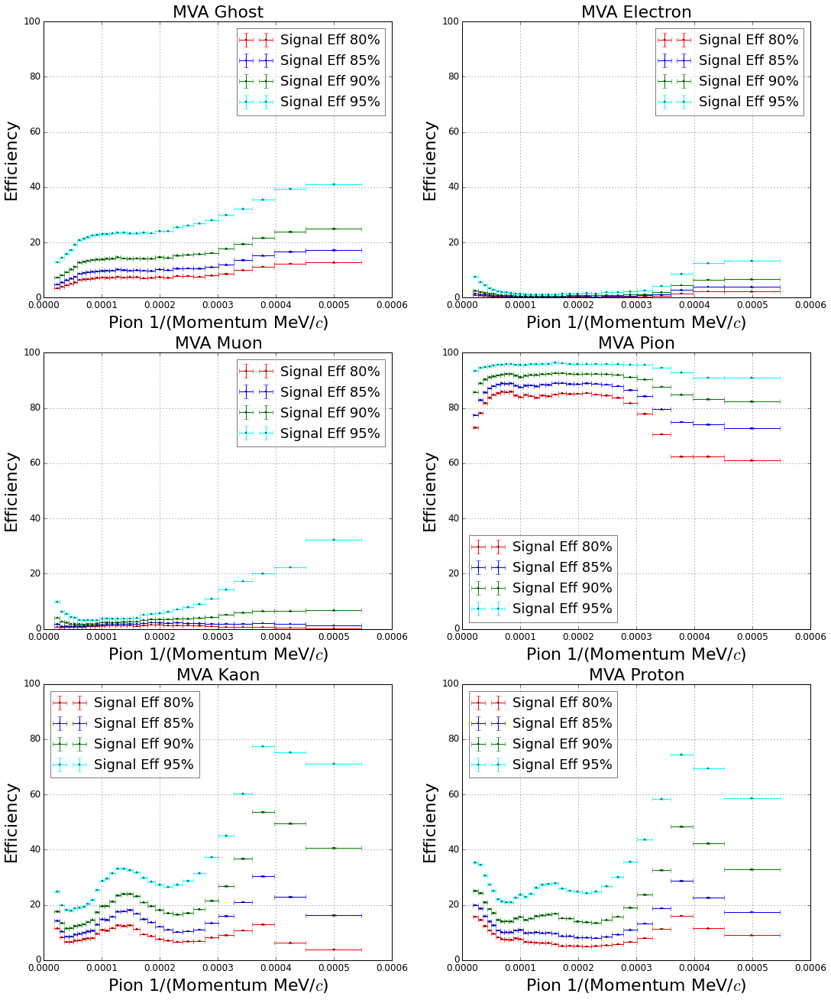

In [41]:
generate_plots(preds_keras_one_layer, data_test.Signal.values, 
               data_test.Weight.values, data_test, path='img/keras_onelayer')

# Keras deep 

In [104]:
import cPickle
with open('models/keras_dl_probs.pkl', 'r') as f:
    preds_keras_dl = cPickle.load(f)

In [105]:
!mkdir img/keras_dl

      Ghost  Electron      Muon      Pion      Kaon    Proton
0  0.959991  0.989993  0.991449  0.955673  0.928875  0.928539


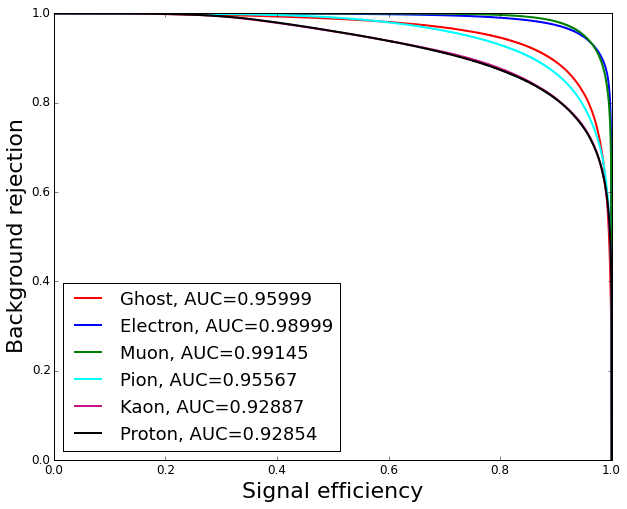

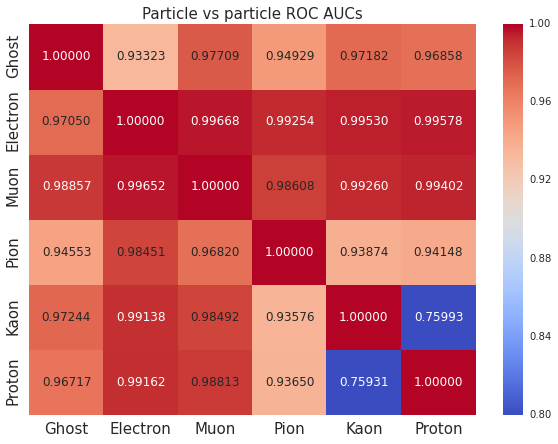

            TrackP   TrackPt
Ghost     0.002498  0.009109
Electron  0.010865  0.047212
Muon      0.042938  0.058284
Pion      0.019421  0.016375
Kaon      0.045837  0.027395
Proton    0.038616  0.047233


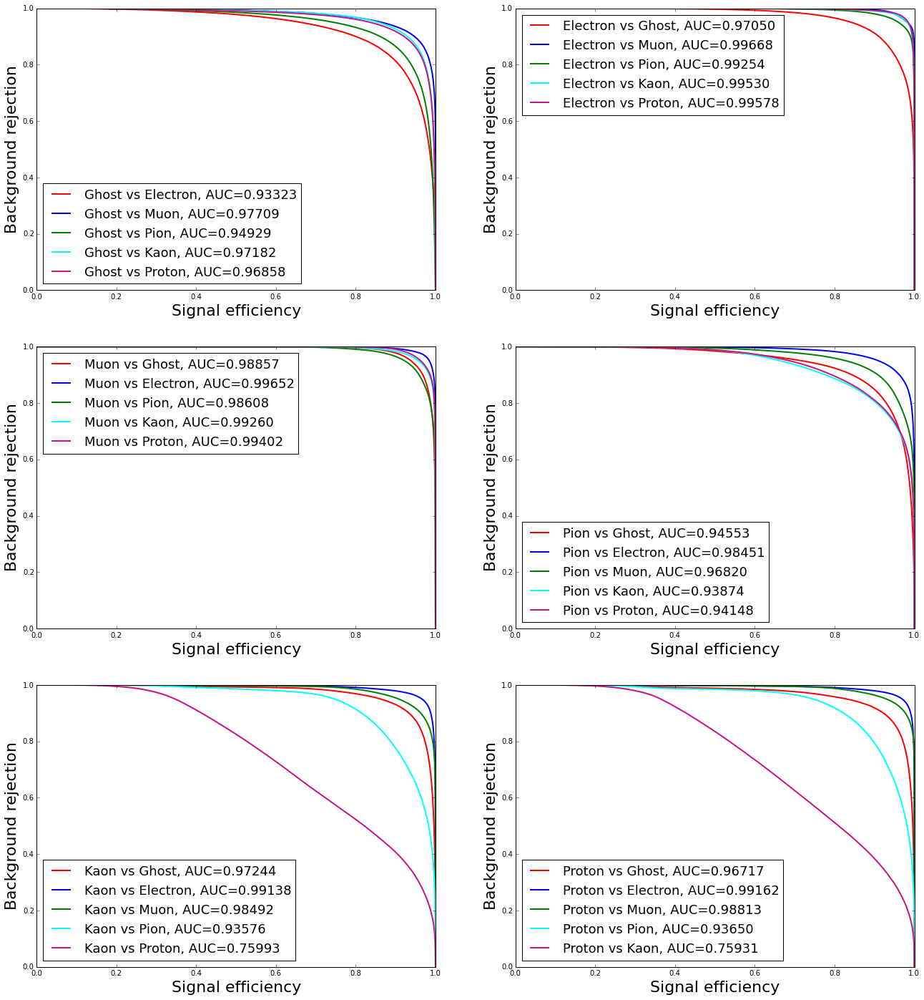

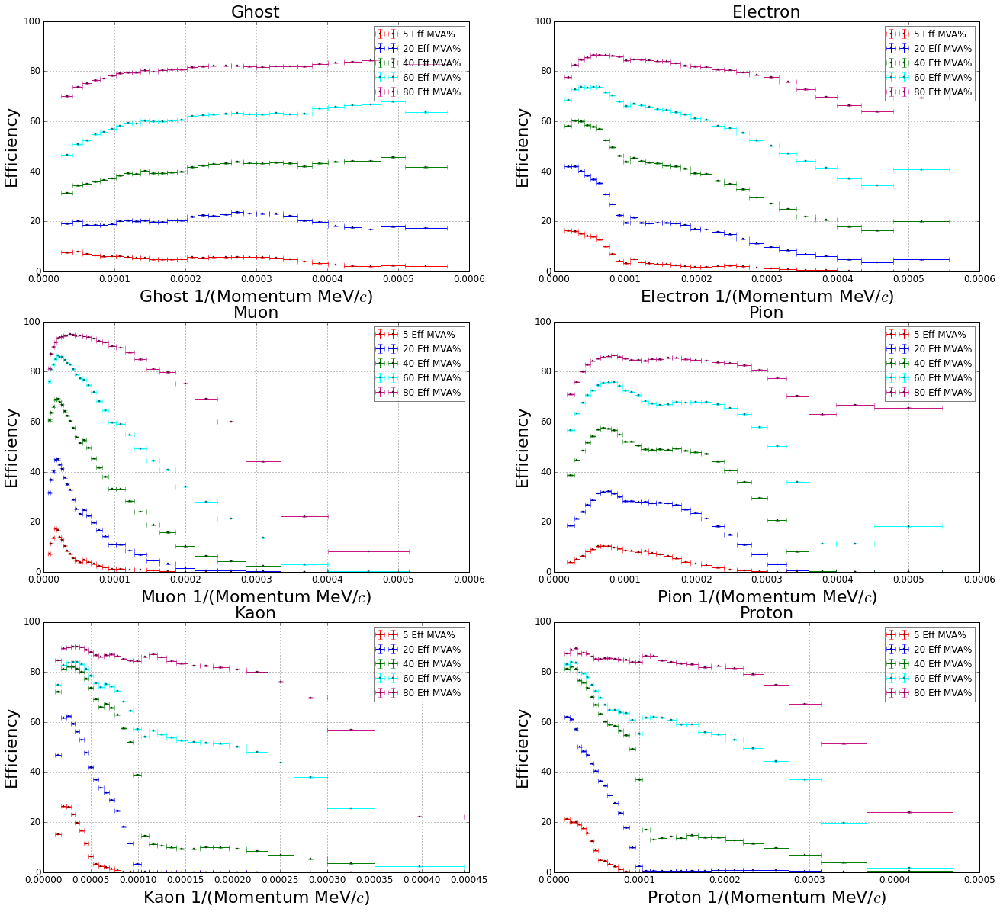

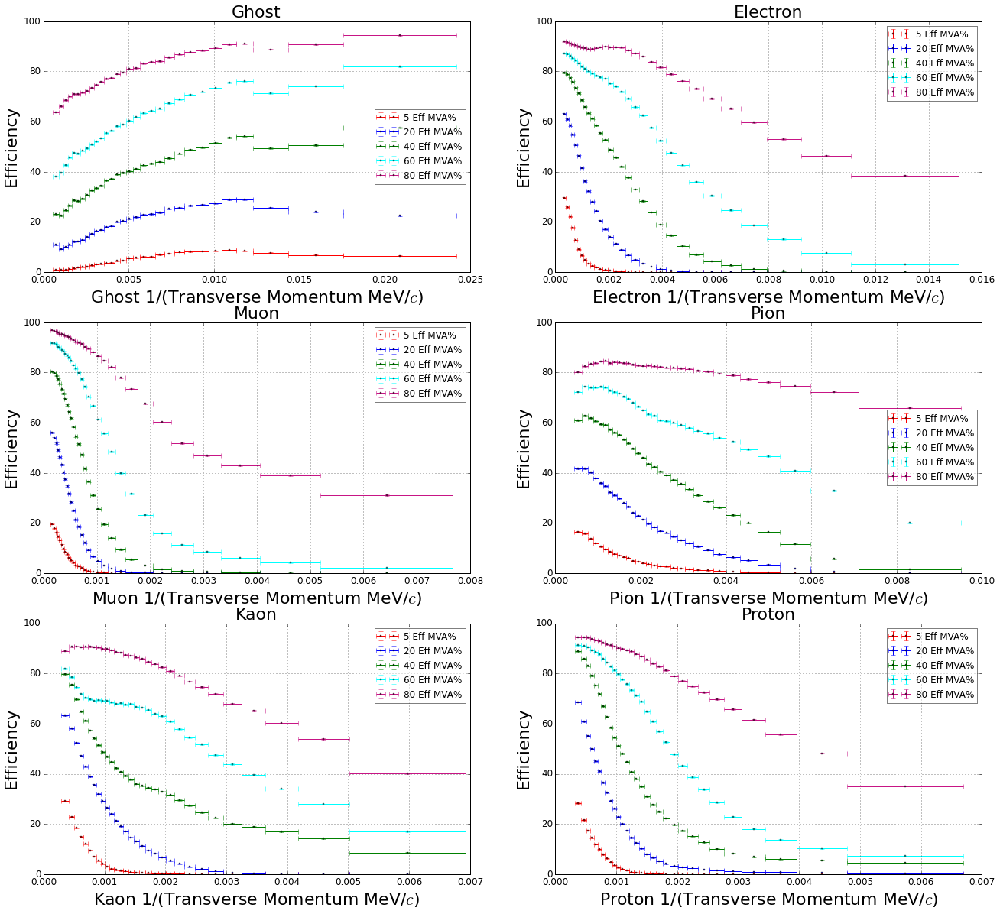

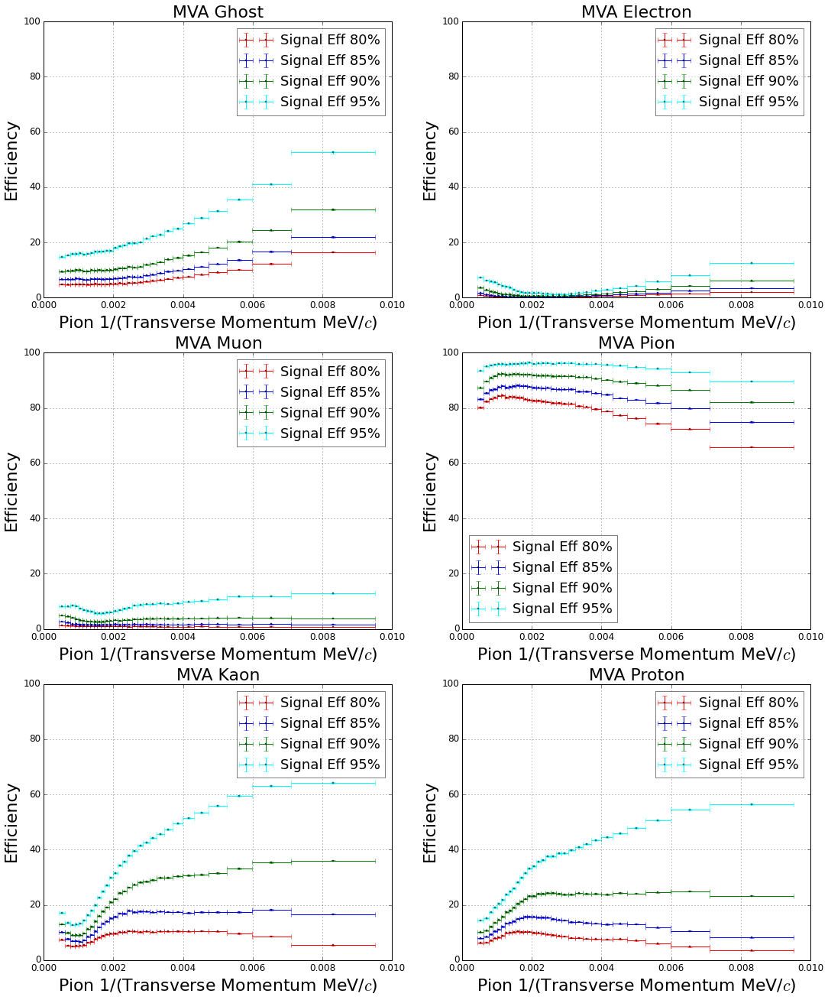

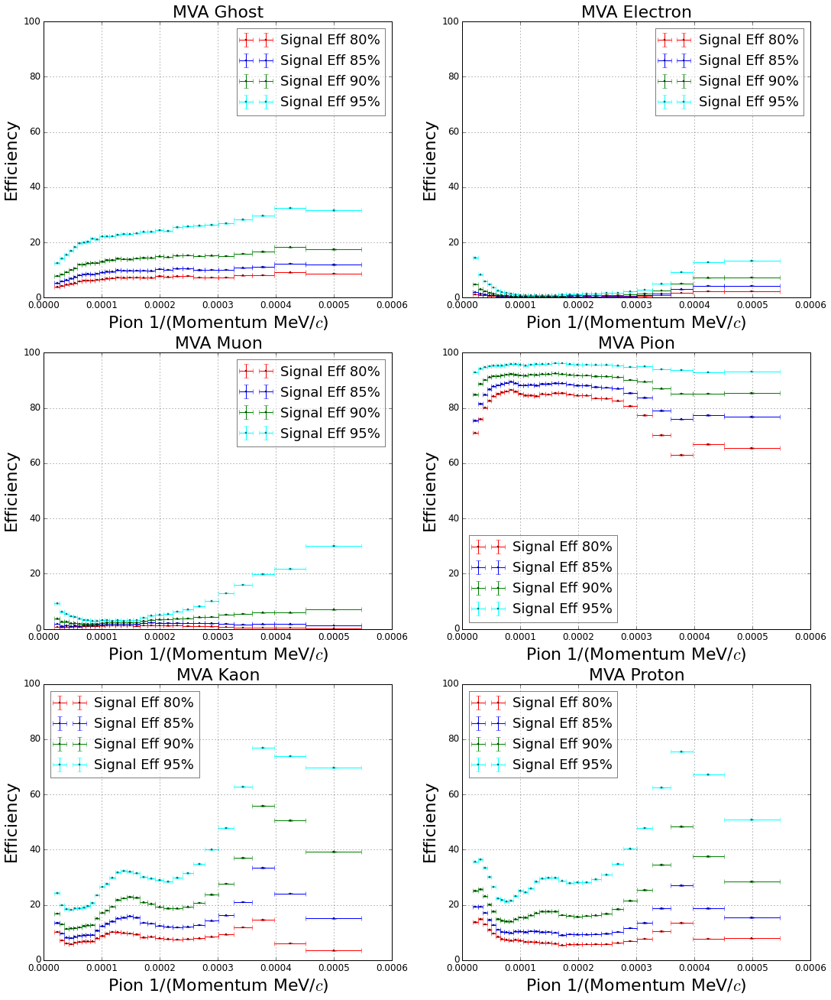

In [106]:
generate_plots(preds_keras_dl, data_test.Signal.values, data_test.Weight.values, data_test, path='img/keras_dl')

# Keras + subdetectors

In [131]:
import cPickle
with open('models/keras_subdetectors_probs.pkl', 'r') as f:
    preds_keras_subdetectors = cPickle.load(f)

# Keras sublayers

In [28]:
import cPickle
with open('models/keras_sublayers_probs.pkl', 'r') as f:
    preds_keras_sublayers = cPickle.load(f)

      Ghost  Electron      Muon      Pion      Kaon    Proton
0  0.960976  0.990479  0.991934  0.956484  0.929703  0.929617


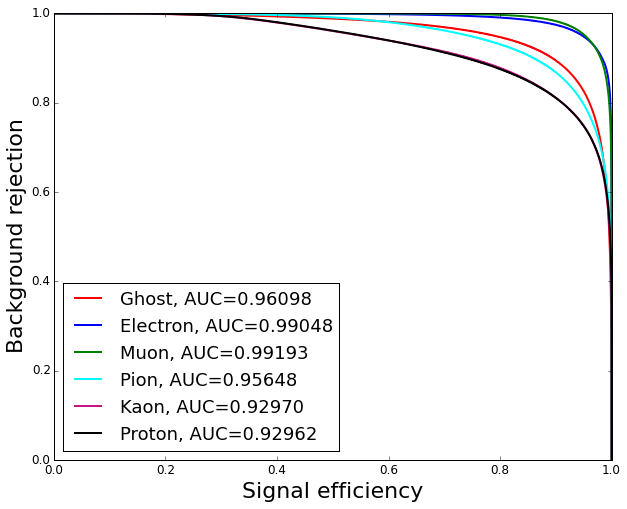

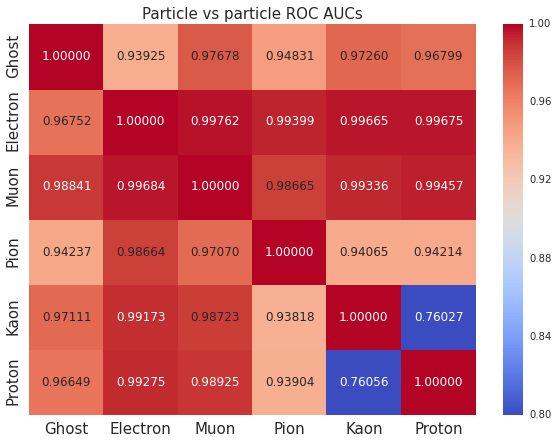

            TrackP   TrackPt
Ghost     0.002661  0.007171
Electron  0.011425  0.047857
Muon      0.037175  0.056562
Pion      0.019368  0.017798
Kaon      0.046637  0.030000
Proton    0.039552  0.048053


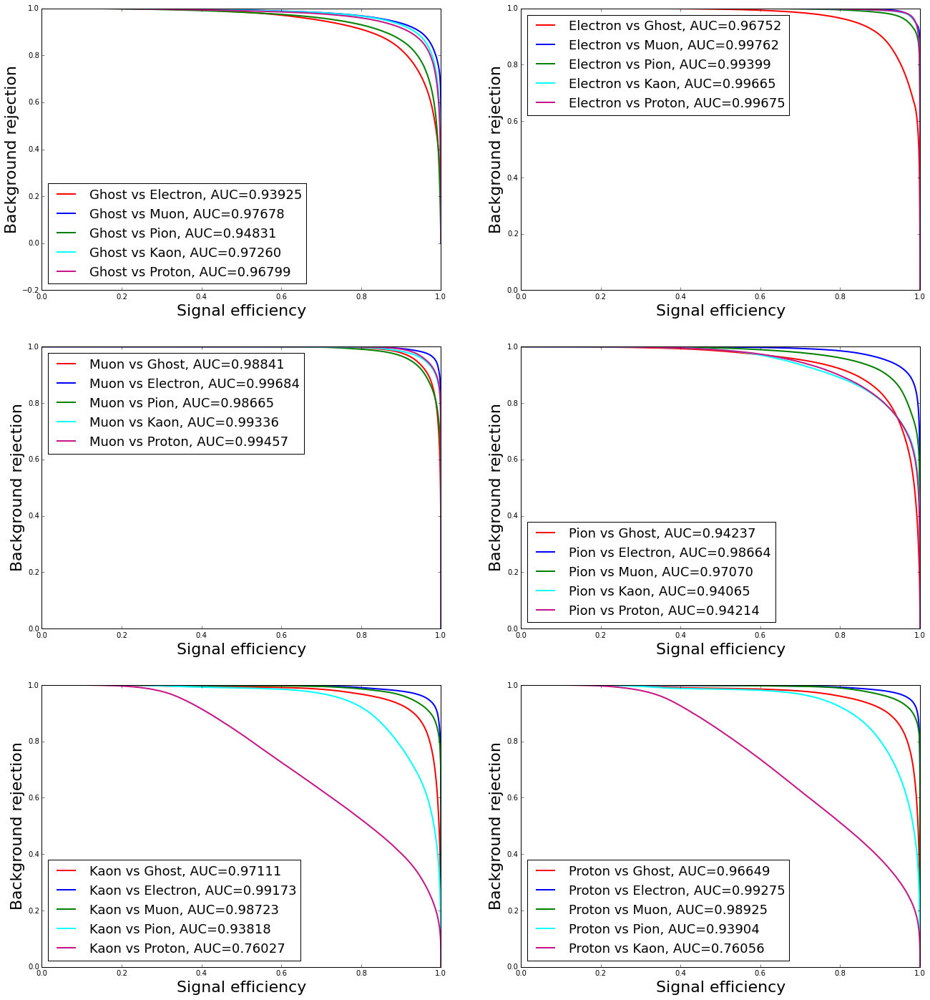

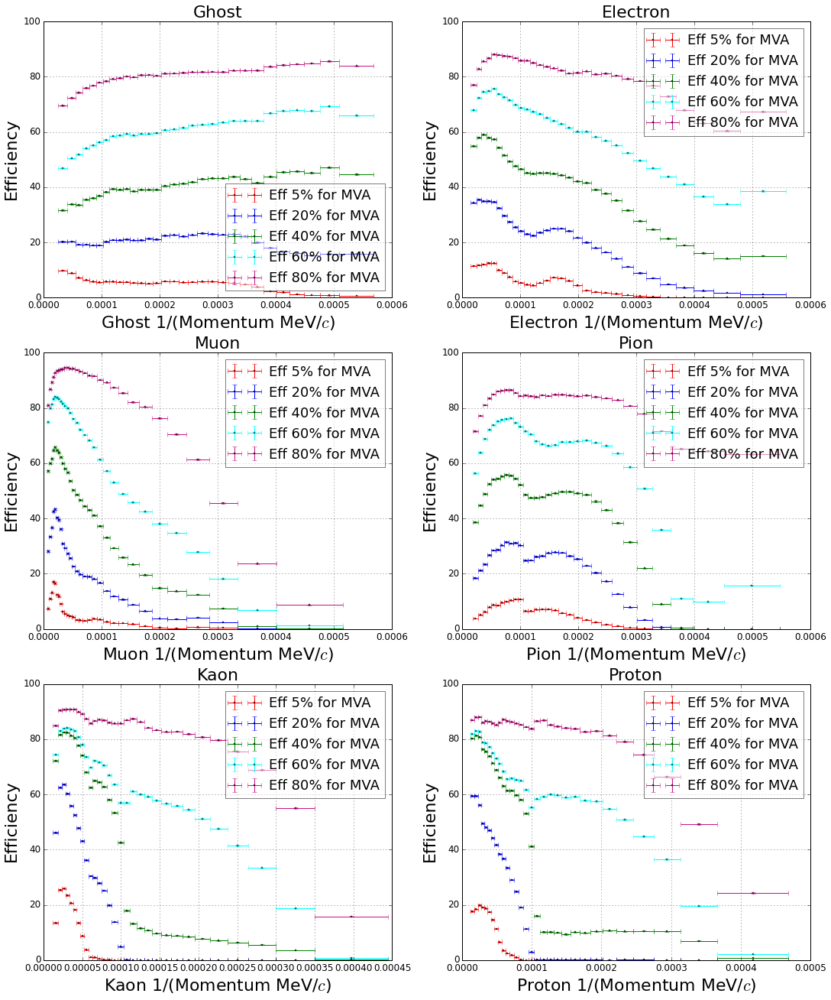

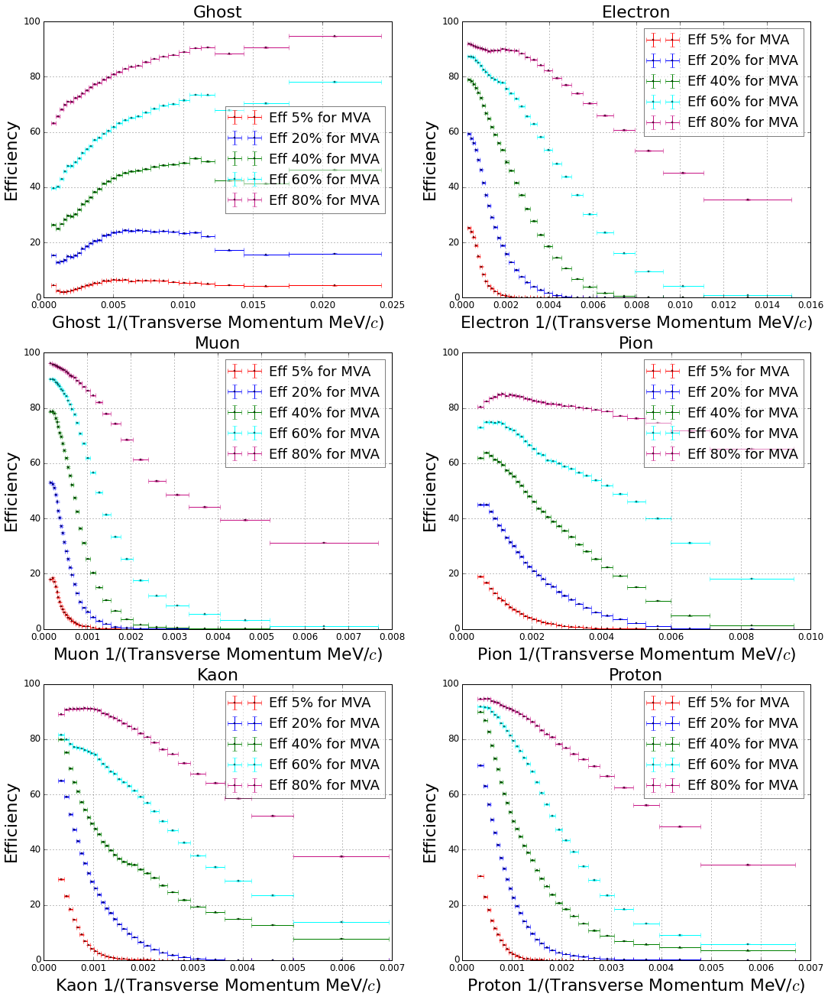

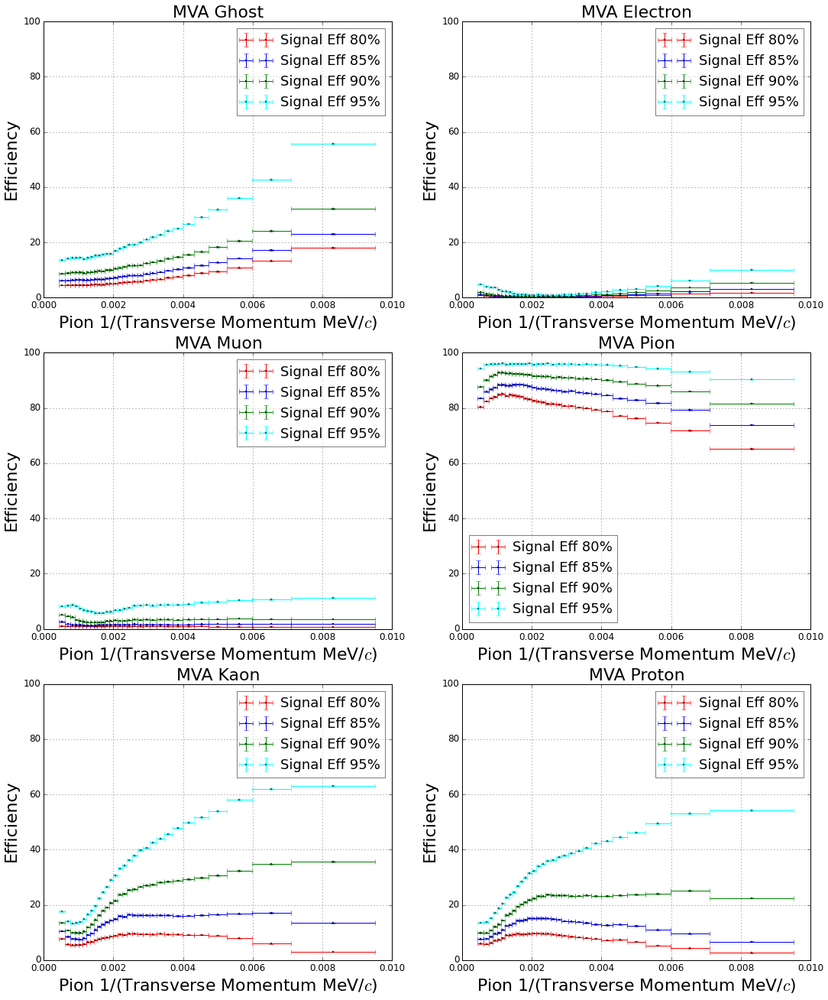

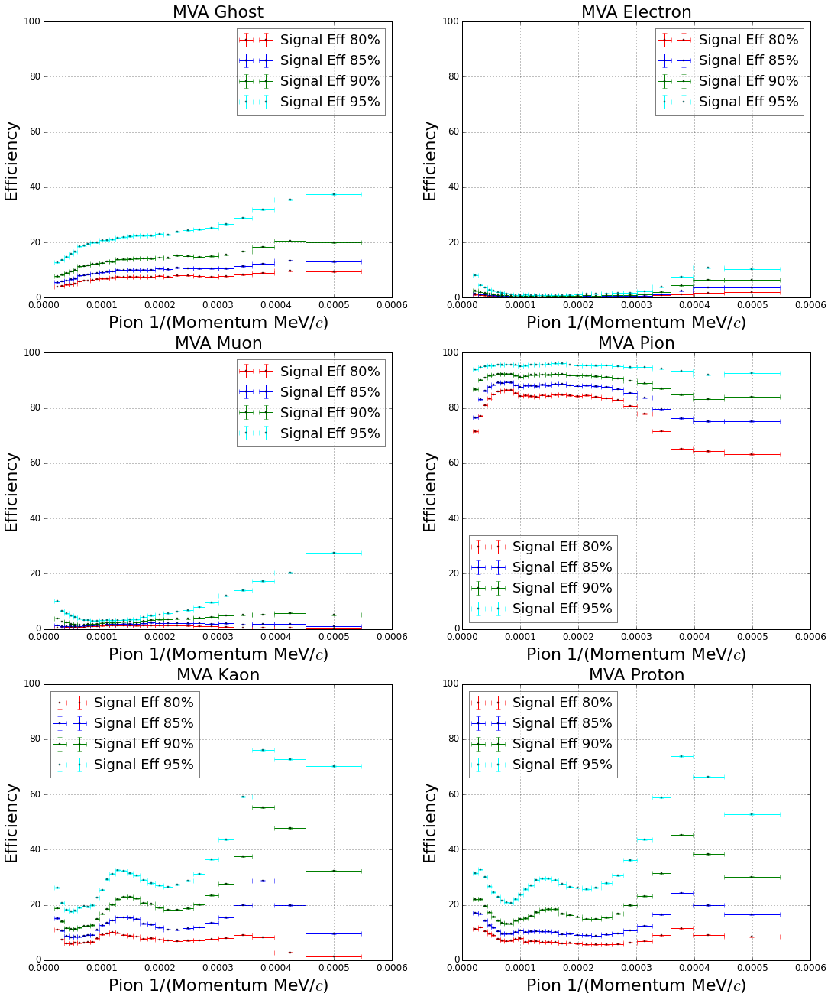

In [32]:
generate_plots(preds_keras_sublayers, data_test.Signal.values, data_test.Weight.values, data_test, path='img/keras_sublayers')

# ROC AUC all models

In [138]:
result_aucs = pandas.concat([roc_auc_score_one_vs_all_for_separate_algorithms(data_test.Signal.values, 
                                                                              preds, data_test.Weight.values) \
                            for preds in [preds_baseline, preds_keras_one_layer, preds_keras_dl, 
                                          preds_keras_subdetectors,
                                          preds_keras_sublayers, preds_xgb, preds_dt]])

In [139]:
result_aucs.index = ['baseline', 'keras one layer', 'keras DL', 'stacked NN', 'special NN', 'XGBoost', 'special BDT']
result_aucs

,Ghost,Electron,Muon,Pion,Kaon,Proton
baseline,0.948407,0.985487,0.984409,0.934599,0.914773,0.917803
keras one layer,0.958320,0.989737,0.991355,0.954533,0.926137,0.925448
keras DL,0.959991,0.989993,0.991449,0.955673,0.928875,0.928539
stacked NN,0.959870,0.989789,0.991528,0.955157,0.928085,0.927904
special NN,0.960976,0.990479,0.991934,0.956484,0.929703,0.929617
XGBoost,0.960901,0.990869,0.992283,0.956803,0.930359,0.930248
special BDT,0.963660,0.991364,0.992683,0.957662,0.930922,0.931059


In [140]:
result_aucs.ix[['keras one layer', 'keras DL', 'stacked NN', 'special NN']]

,Ghost,Electron,Muon,Pion,Kaon,Proton
keras one layer,0.958320,0.989737,0.991355,0.954533,0.926137,0.925448
keras DL,0.959991,0.989993,0.991449,0.955673,0.928875,0.928539
stacked NN,0.959870,0.989789,0.991528,0.955157,0.928085,0.927904
special NN,0.960976,0.990479,0.991934,0.956484,0.929703,0.929617


# Comparison of the best NN and best BDT with the baseline

In [121]:
cvm_values_baseline = compute_cvm_by_particle(data_test.Signal.values, preds_baseline, 
                                              {'TrackP': data_test.TrackP.values, 'TrackPt': data_test.TrackPt.values})
cvm_values_nn = compute_cvm_by_particle(data_test.Signal.values, preds_keras_sublayers, 
                                        {'TrackP': data_test.TrackP.values, 'TrackPt': data_test.TrackPt.values})
cvm_values_dt = compute_cvm_by_particle(data_test.Signal.values, preds_dt, 
                                        {'TrackP': data_test.TrackP.values, 'TrackPt': data_test.TrackPt.values})

In [122]:
cvm_values_baseline

,TrackP,TrackPt
Ghost,0.003707,0.006480
Electron,0.007750,0.021756
Muon,0.026489,0.035962
Pion,0.020184,0.013491
Kaon,0.042760,0.032328
Proton,0.037028,0.043761


In [123]:
cvm_values_nn

,TrackP,TrackPt
Ghost,0.002661,0.007171
Electron,0.011425,0.047857
Muon,0.037175,0.056562
Pion,0.019368,0.017798
Kaon,0.046637,0.030000
Proton,0.039552,0.048053


In [124]:
cvm_values_dt

,TrackP,TrackPt
Ghost,0.003038,0.009252
Electron,0.012236,0.048241
Muon,0.040494,0.060058
Pion,0.019472,0.016038
Kaon,0.044647,0.028331
Proton,0.035281,0.043130


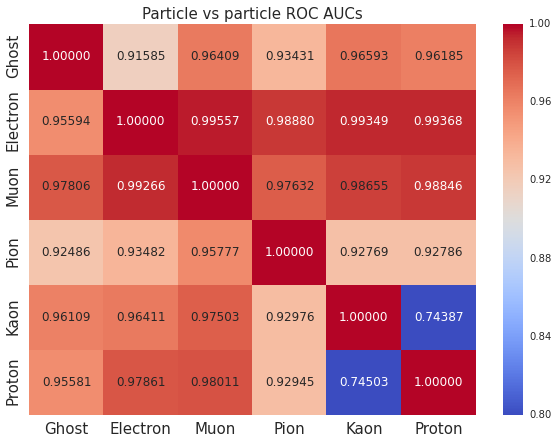

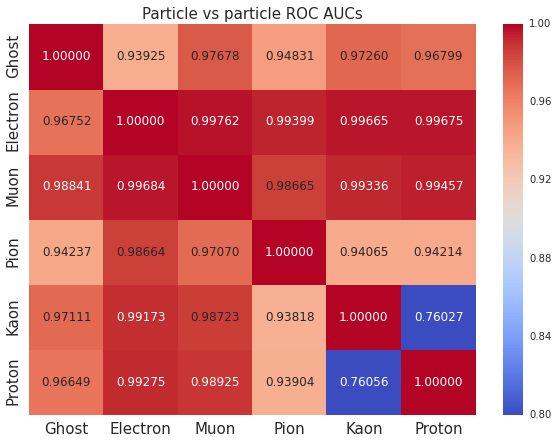

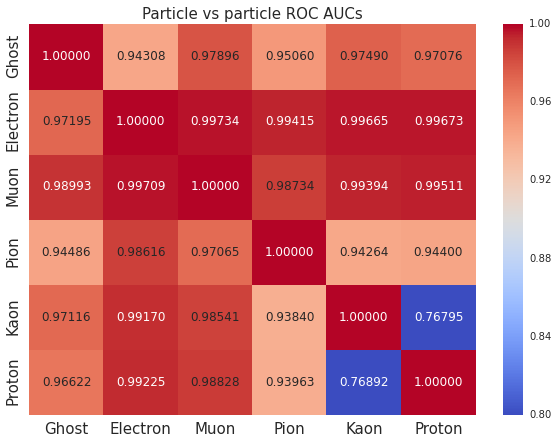

In [97]:
_, matrix_auc_one_vs_one_baseline = compute_roc_auc_matrix(data_test.Signal.values, 
                                                           preds_baseline, data_test.Weight.values)
_, matrix_auc_one_vs_one_nn = compute_roc_auc_matrix(data_test.Signal.values, 
                                                     preds_keras_sublayers, data_test.Weight.values)
_, matrix_auc_one_vs_one_dt = compute_roc_auc_matrix(data_test.Signal.values, 
                                                     preds_dt, data_test.Weight.values)

pass

## AUCs

In [91]:
from utils import plot_matrix, compute_eta, plot_flatness_by_particle

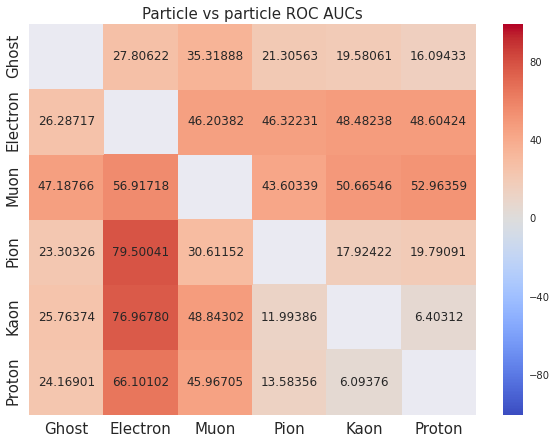

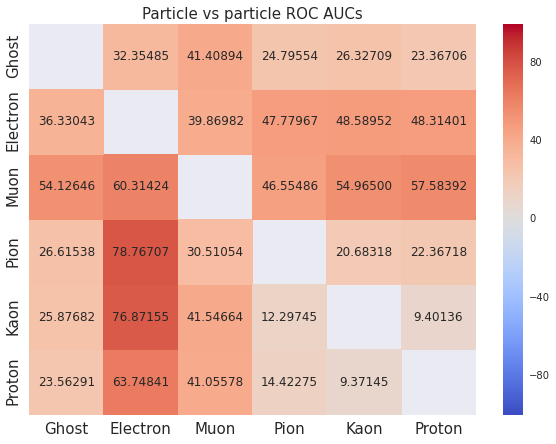

In [98]:
_ = plot_matrix((1 - (1 - matrix_auc_one_vs_one_nn) / (1 - matrix_auc_one_vs_one_baseline)) * 100, vmin=-100, vmax=100)
_ = plot_matrix((1 - (1 - matrix_auc_one_vs_one_dt) / (1 - matrix_auc_one_vs_one_baseline)) * 100, vmin=-100, vmax=100)

In [68]:
data_test['eta'] = compute_eta(data_test.TrackP.values, data_test.TrackPt.values)

## NN rocs

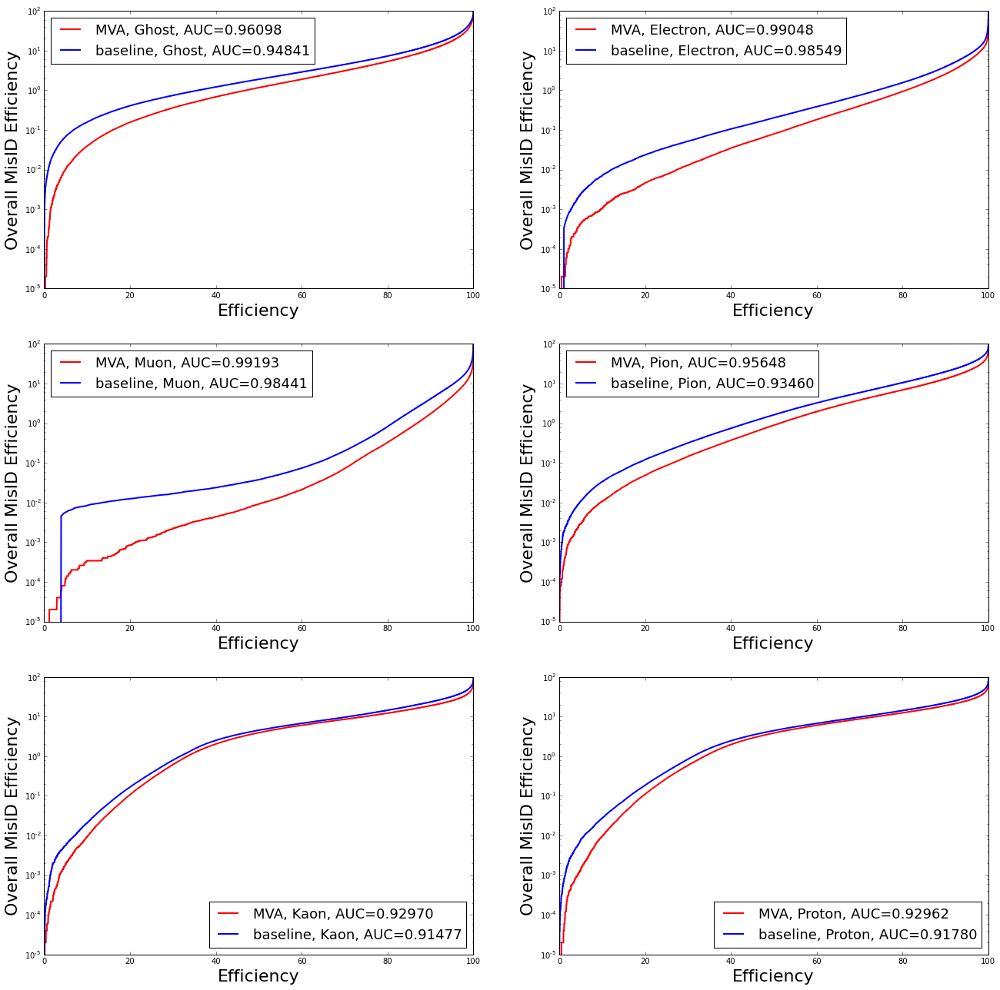

In [130]:
plot_roc_one_vs_rest(data_test.Signal.values, preds_keras_sublayers, data_test.Weight.values, 
                     physics_notion=True, separate_particles=True, predictions_dict_comparison=preds_baseline)

## Flatness comparison for NN vs baseline

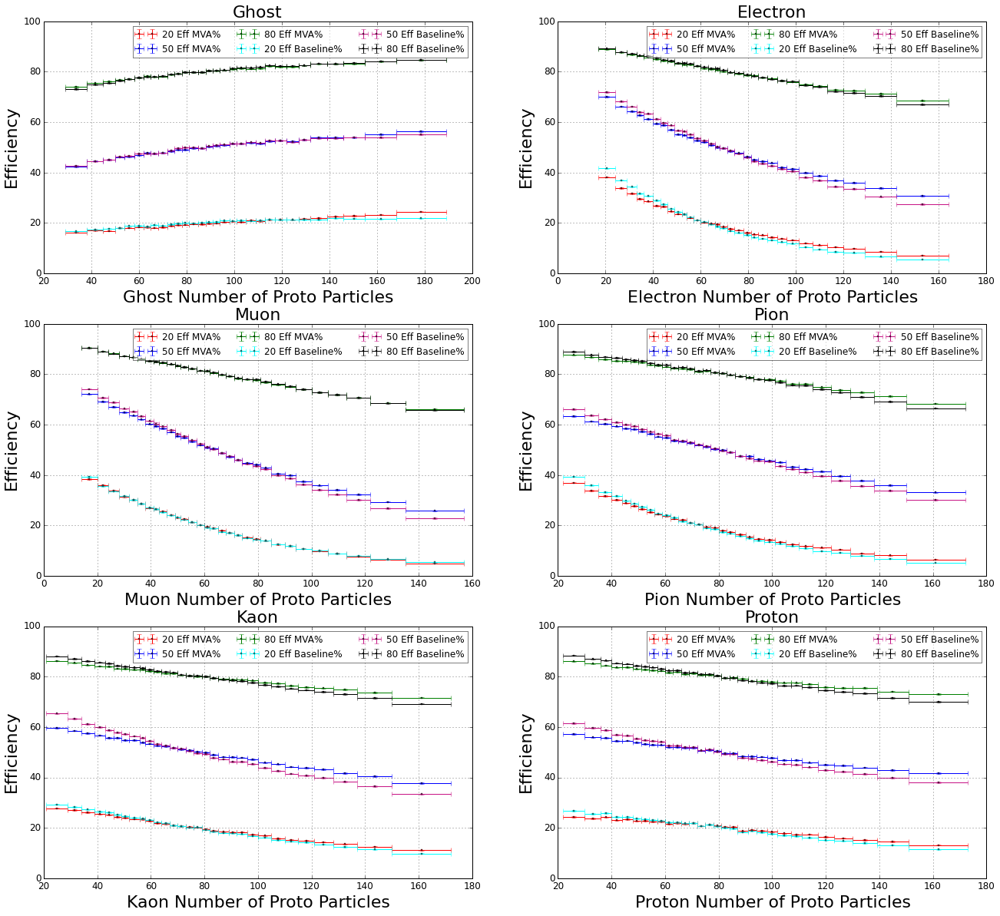

In [92]:
plot_flatness_by_particle(data_test.Signal.values, preds_keras_sublayers, data_test.NumProtoParticles.values,
                          'Number of Proto Particles', predictions_dict_comparison=preds_baseline,
                          thresholds=[20, 50, 80], weights=data_test.Weight.values, 
                          ignored_sideband=0.02, ncol=3)

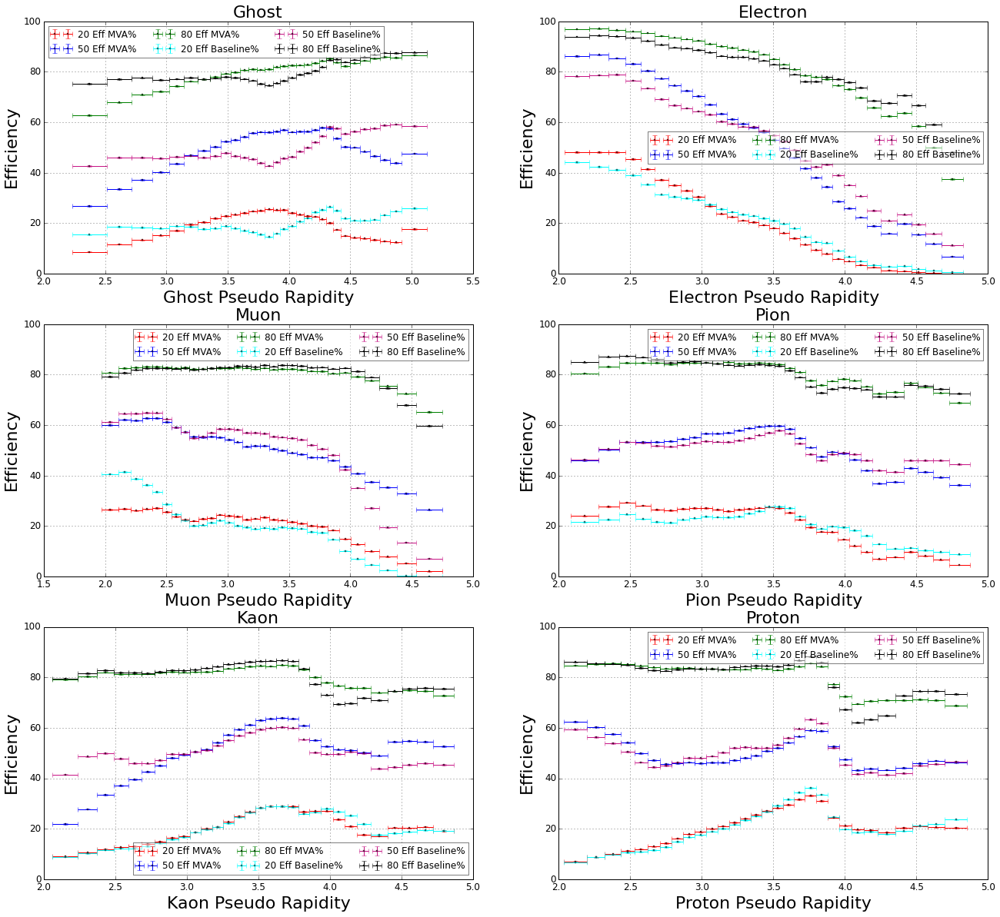

In [101]:
plot_flatness_by_particle(data_test.Signal.values, preds_keras_sublayers, data_test.eta.values,
                          'Pseudo Rapidity', predictions_dict_comparison=preds_baseline,
                          thresholds=[20, 50, 80], weights=data_test.Weight.values, 
                          ignored_sideband=0.02, ncol=3)

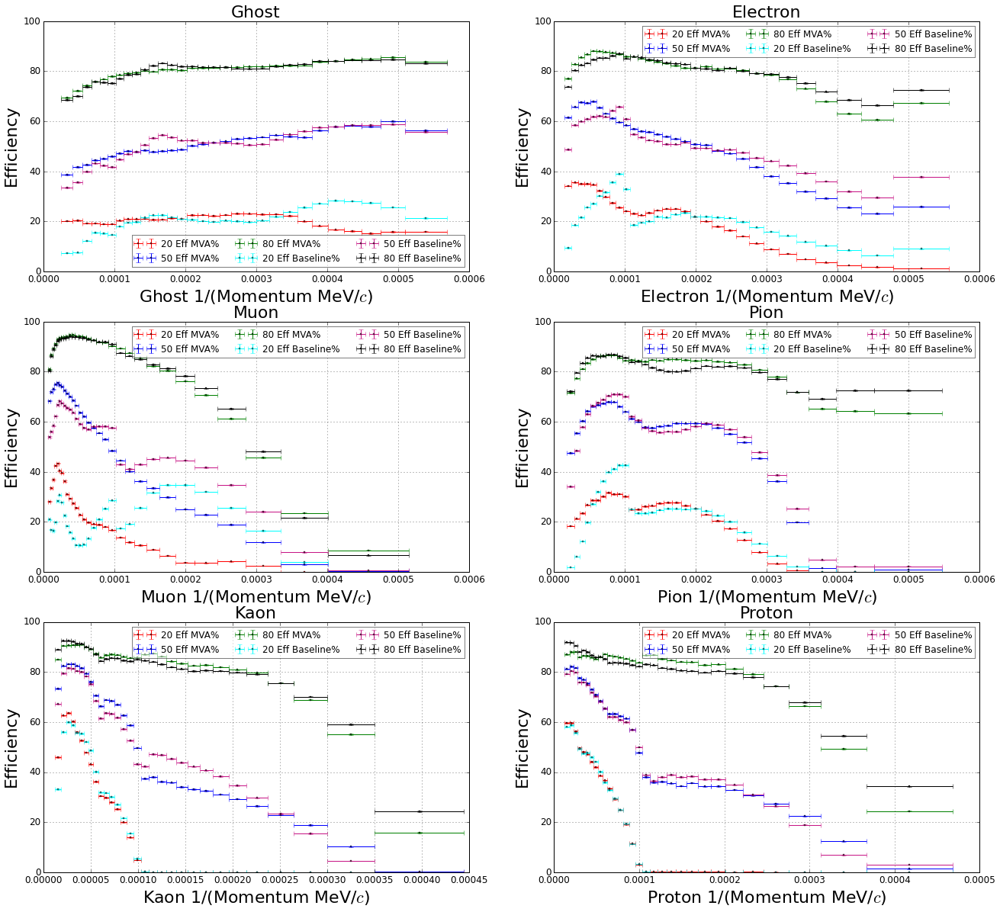

In [102]:
plot_flatness_by_particle(data_test.Signal.values, preds_keras_sublayers, 1 / data_test.TrackP.values,
                          '1/(Momentum MeV/$c$)', predictions_dict_comparison=preds_baseline,
                          thresholds=[20, 50, 80], weights=data_test.Weight.values, 
                          ignored_sideband=0.02, ncol=3)

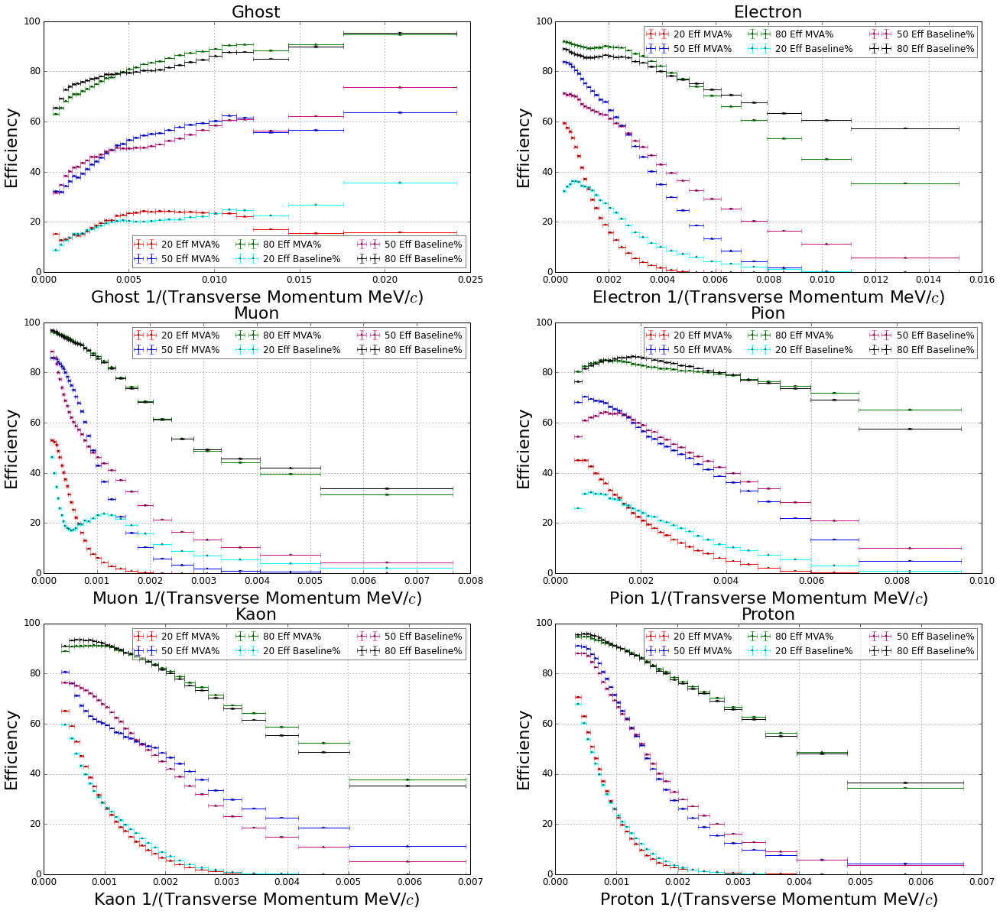

In [103]:
plot_flatness_by_particle(data_test.Signal.values, preds_keras_sublayers, 1 / data_test.TrackPt.values,
                          '1/(Transverse Momentum MeV/$c$)', predictions_dict_comparison=preds_baseline,
                          thresholds=[20, 50, 80], weights=data_test.Weight.values, 
                          ignored_sideband=0.02, ncol=3)

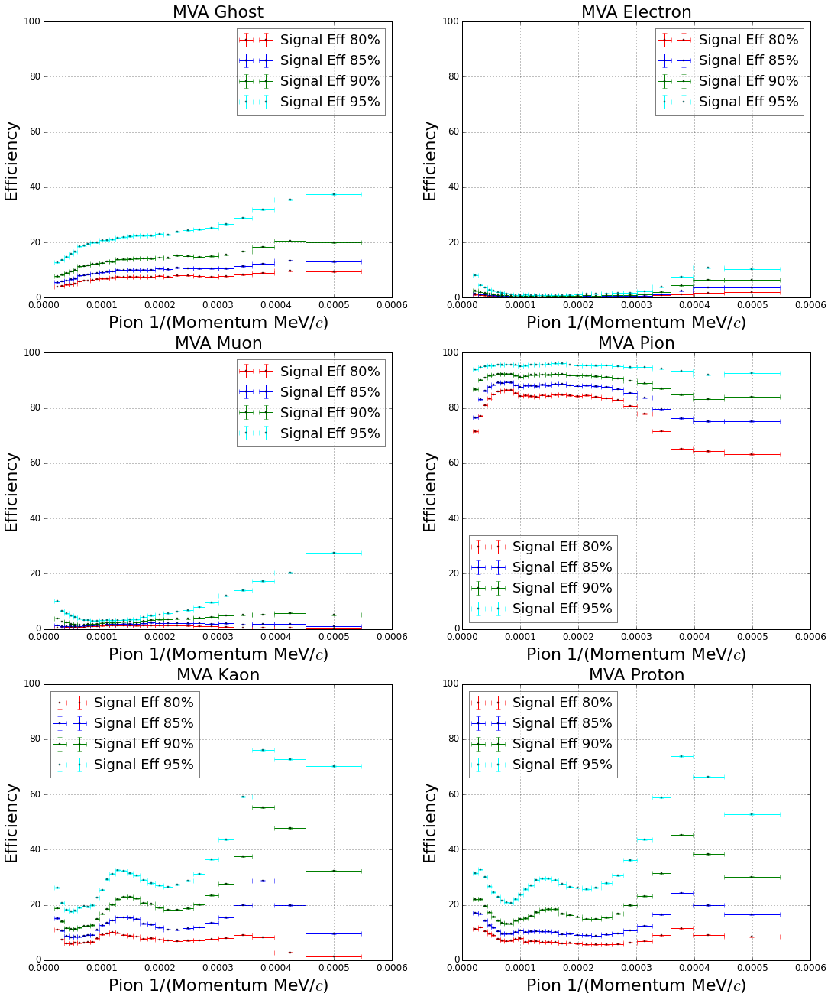

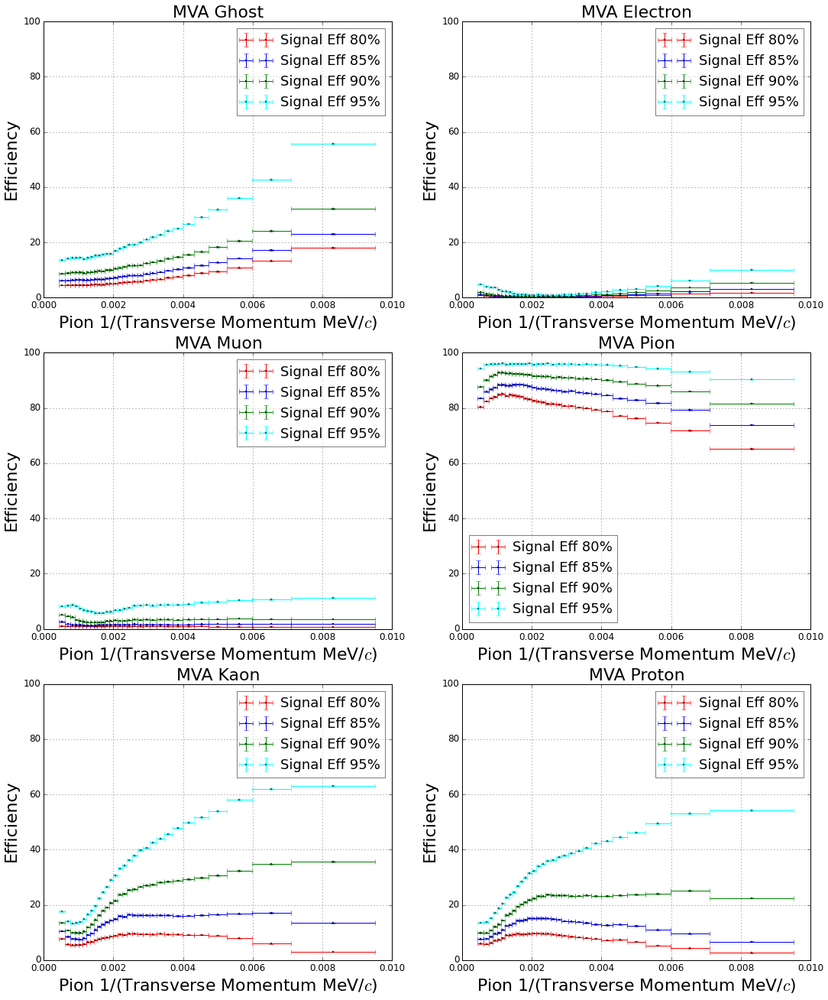

In [143]:
plot_flatness_particle(data_test.Signal.values, preds_keras_sublayers, 1 / data_test.TrackP.values,
                          '1/(Momentum MeV/$c$)', particle_name='Pion', thresholds=[80, 85, 90, 95],
                           weights=data_test.Weight.values, 
                           ignored_sideband=0.02)
plot_flatness_particle(data_test.Signal.values, preds_keras_sublayers, 1 / data_test.TrackPt.values,
                          '1/(Transverse Momentum MeV/$c$)', particle_name='Pion', thresholds=[80, 85, 90, 95],
                           weights=data_test.Weight.values, 
                           ignored_sideband=0.02)

## DT rocs

ERROR! Session/line number was not unique in database. History logging moved to new session 3355


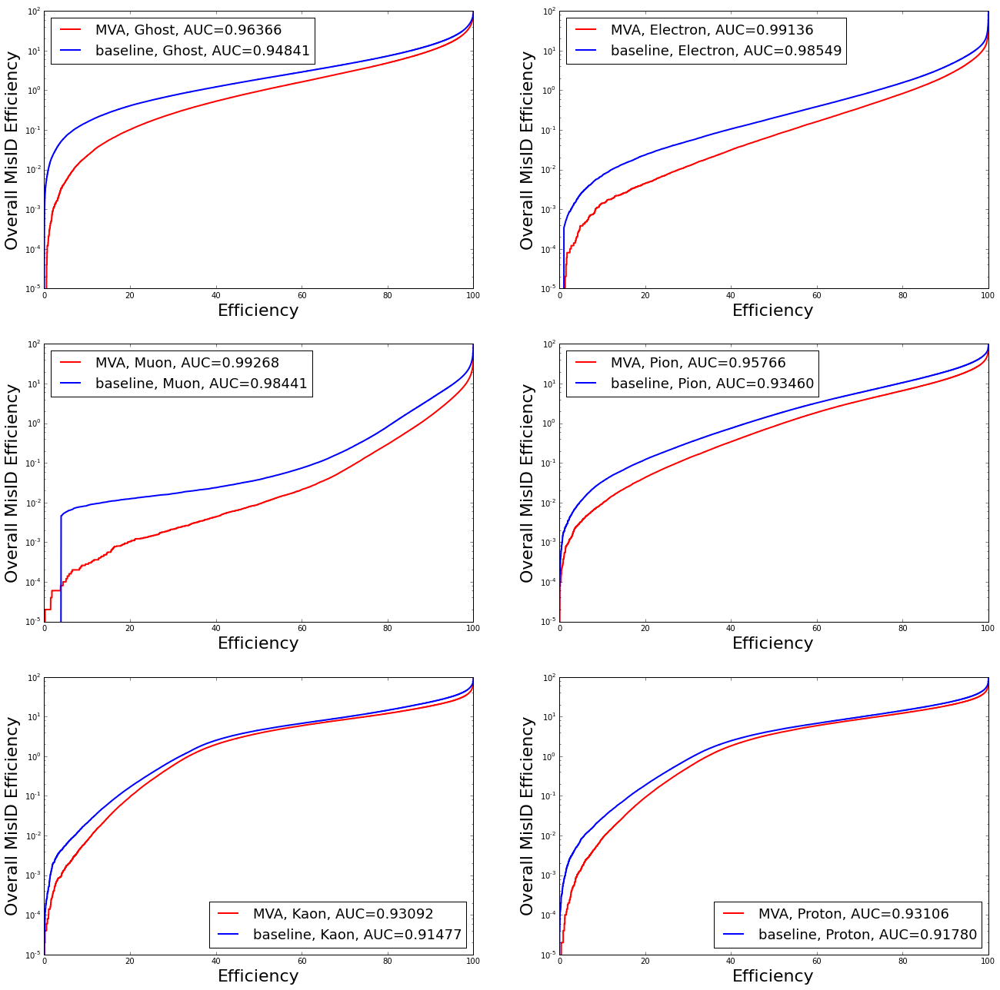

In [129]:
plot_roc_one_vs_rest(data_test.Signal.values, preds_dt, data_test.Weight.values, 
                     physics_notion=True, separate_particles=True, predictions_dict_comparison=preds_baseline)

## DT flatness

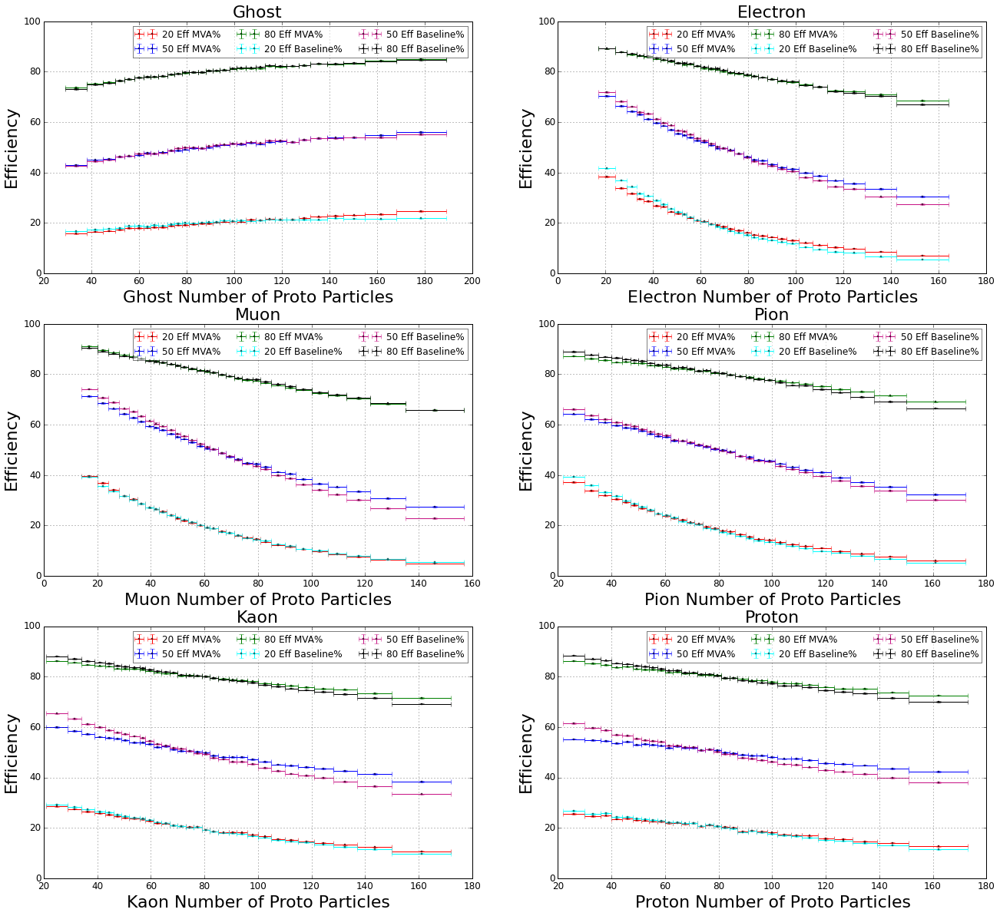

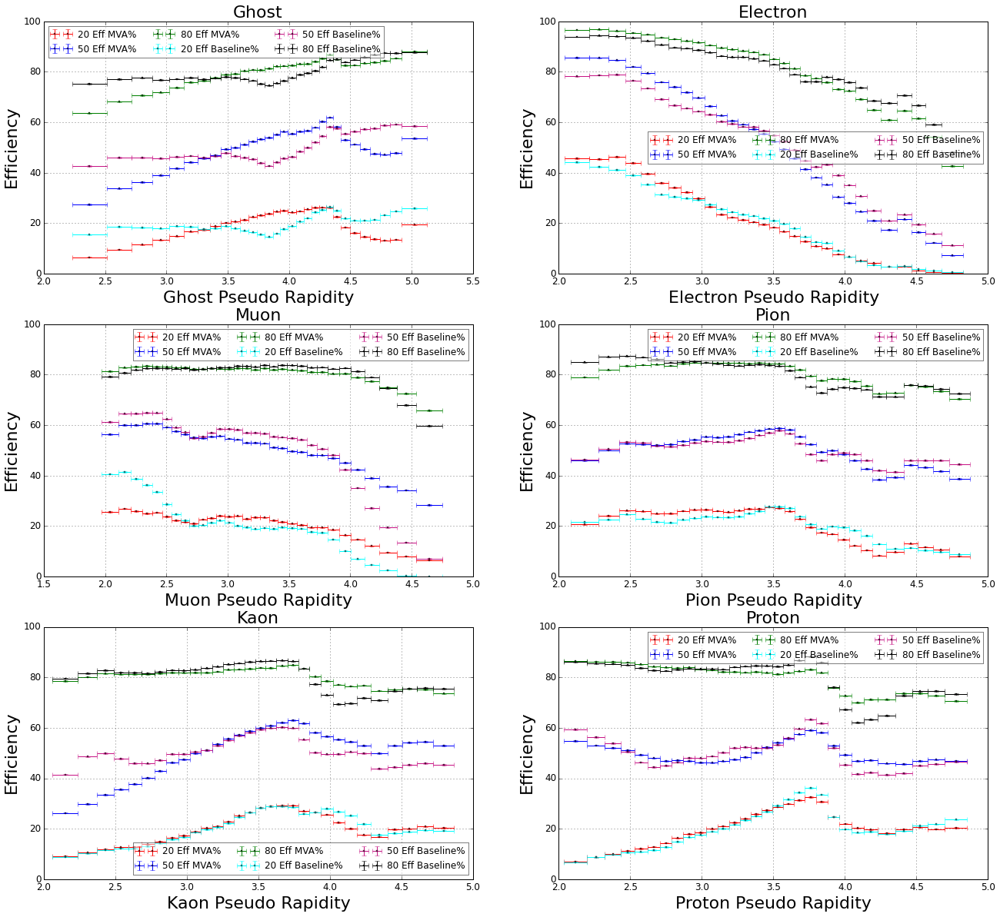

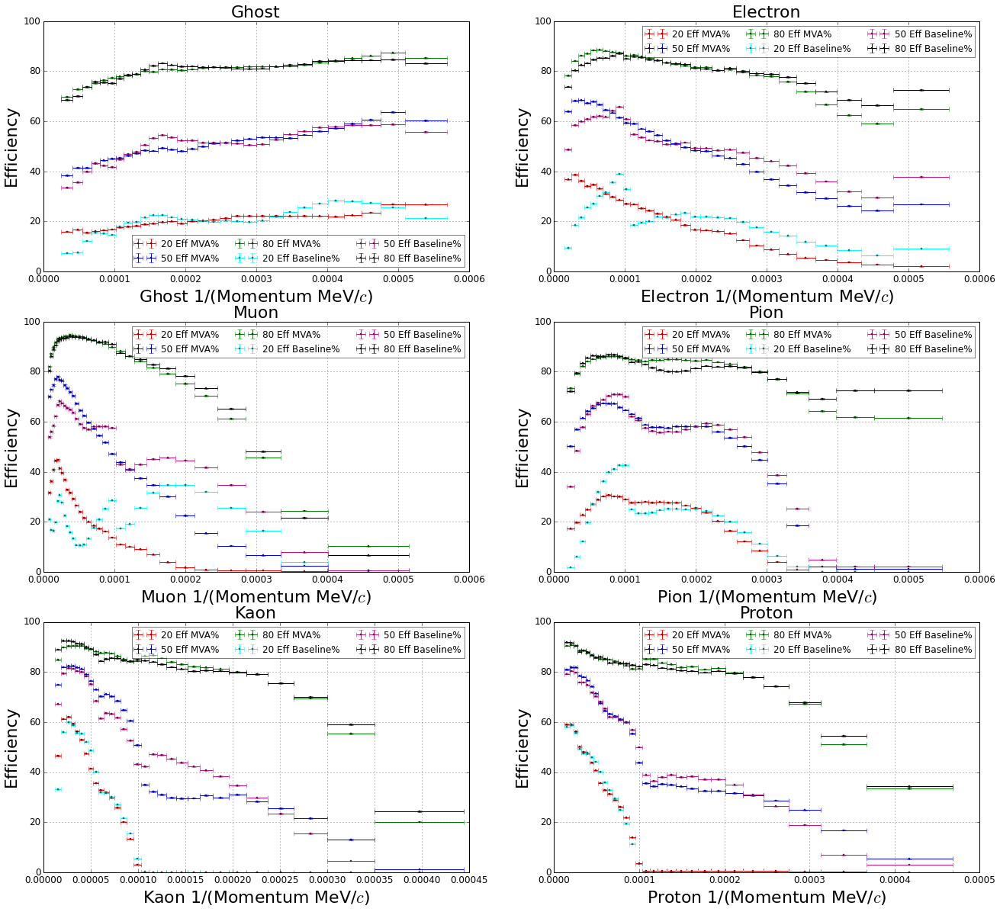

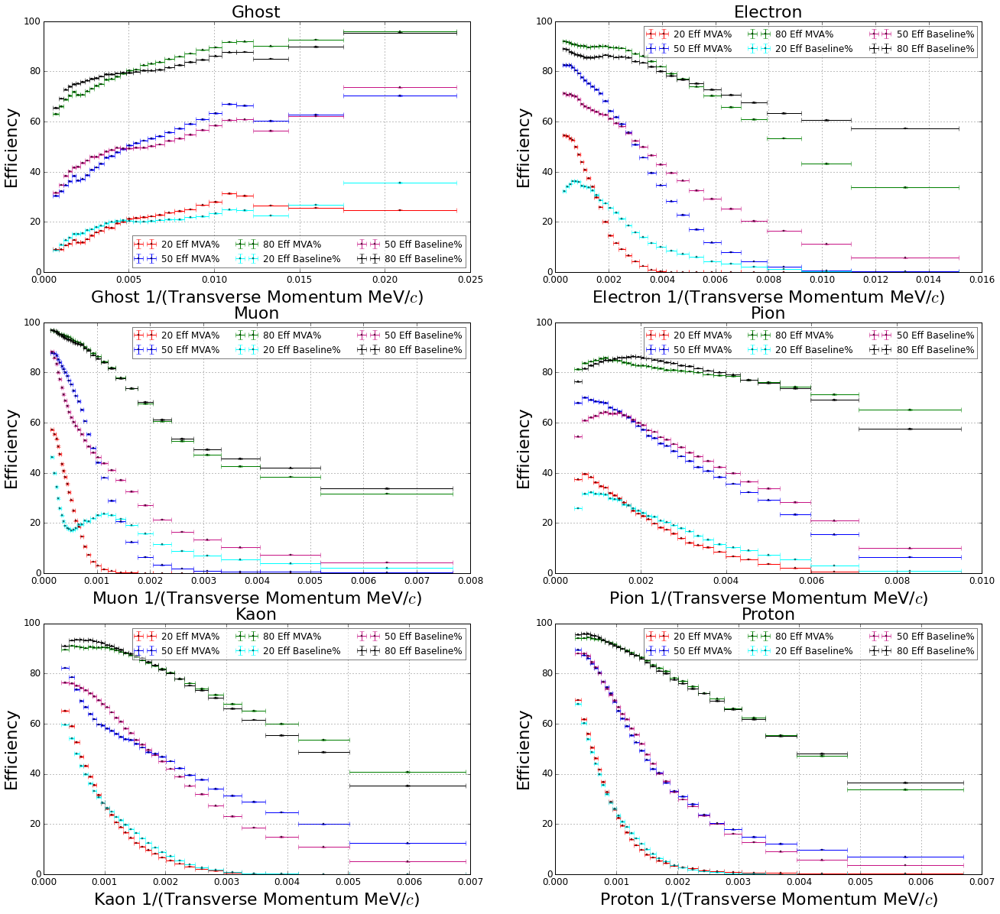

In [110]:
plot_flatness_by_particle(data_test.Signal.values, preds_dt, data_test.NumProtoParticles.values,
                          'Number of Proto Particles', predictions_dict_comparison=preds_baseline,
                          thresholds=[20, 50, 80], weights=data_test.Weight.values, 
                          ignored_sideband=0.02, ncol=3)
plot_flatness_by_particle(data_test.Signal.values, preds_dt, data_test.eta.values,
                          'Pseudo Rapidity', predictions_dict_comparison=preds_baseline,
                          thresholds=[20, 50, 80], weights=data_test.Weight.values, 
                          ignored_sideband=0.02, ncol=3)
plot_flatness_by_particle(data_test.Signal.values, preds_dt, 1 / data_test.TrackP.values,
                          '1/(Momentum MeV/$c$)', predictions_dict_comparison=preds_baseline,
                          thresholds=[20, 50, 80], weights=data_test.Weight.values, 
                          ignored_sideband=0.02, ncol=3)
plot_flatness_by_particle(data_test.Signal.values, preds_dt, 1 / data_test.TrackPt.values,
                          '1/(Transverse Momentum MeV/$c$)', predictions_dict_comparison=preds_baseline,
                          thresholds=[20, 50, 80], weights=data_test.Weight.values, 
                          ignored_sideband=0.02, ncol=3)

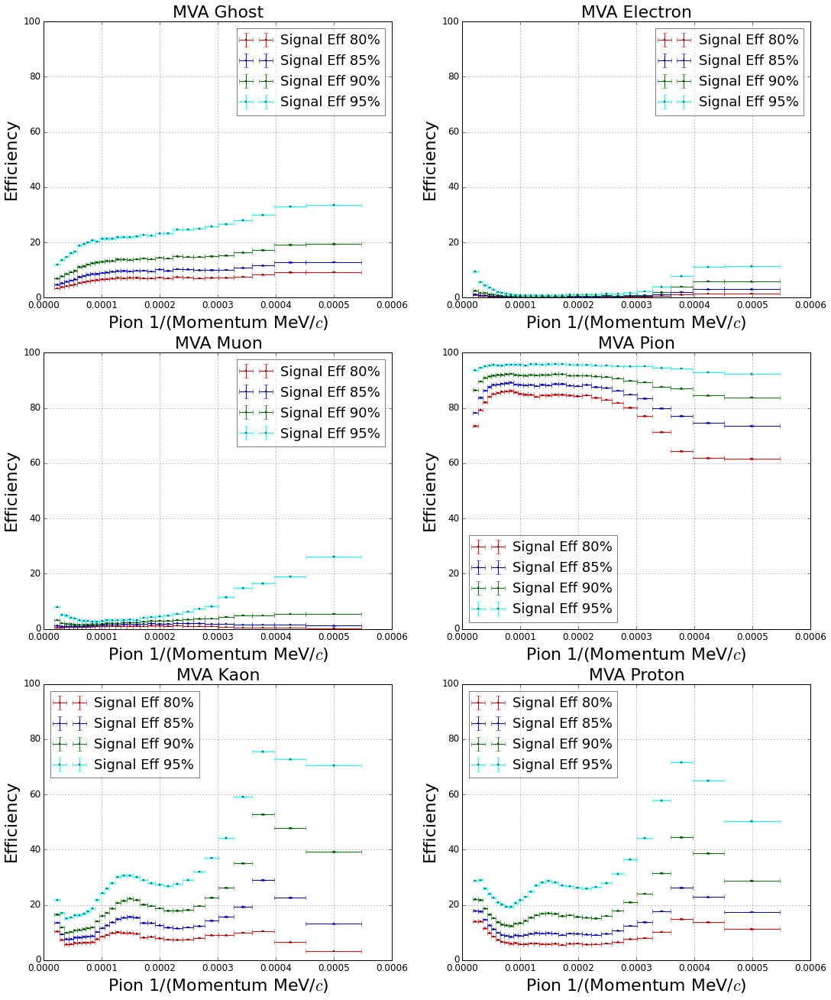

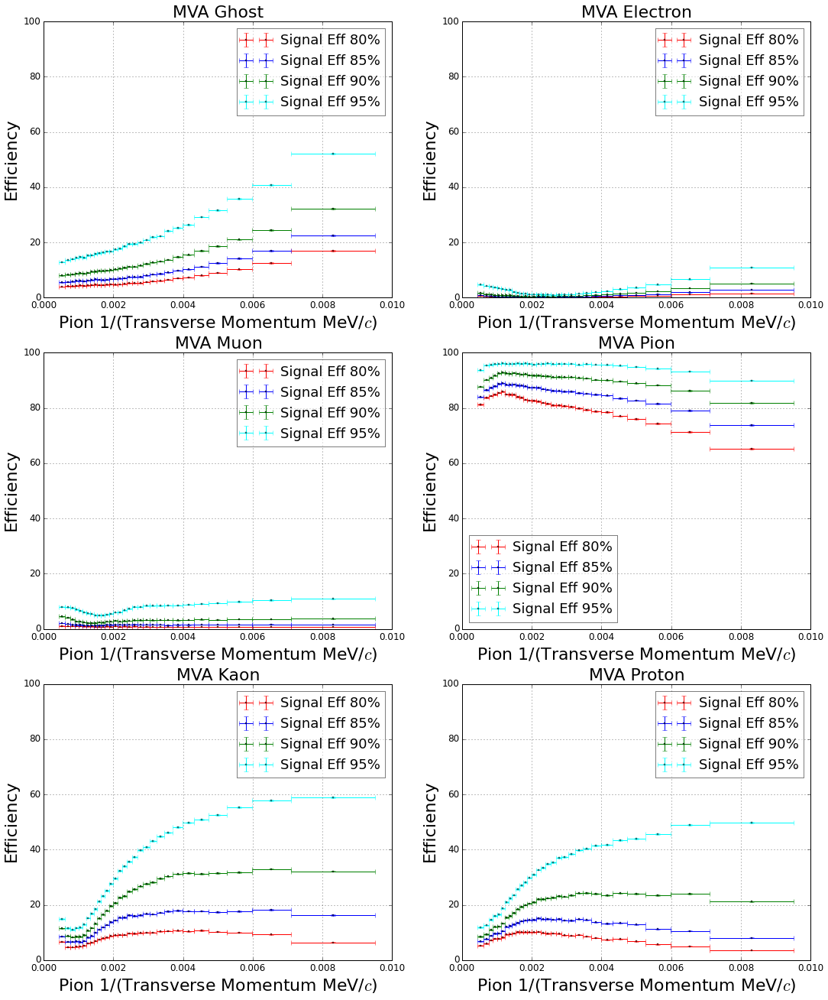

In [142]:
plot_flatness_particle(data_test.Signal.values, preds_dt, 1 / data_test.TrackP.values,
                          '1/(Momentum MeV/$c$)', particle_name='Pion', thresholds=[80, 85, 90, 95],
                           weights=data_test.Weight.values, 
                           ignored_sideband=0.02)
plot_flatness_particle(data_test.Signal.values, preds_dt, 1 / data_test.TrackPt.values,
                          '1/(Transverse Momentum MeV/$c$)', particle_name='Pion', thresholds=[80, 85, 90, 95],
                           weights=data_test.Weight.values, 
                           ignored_sideband=0.02)